# Avocado Project    
Project Description    
This data was downloaded from the Hass Avocado Board website in May of 2018 & compiled into a single CSV. 
The table below represents weekly 2018 retail scan data for National retail volume (units) and price. Retail scan data comes directly from retailers’ cash registers based on actual retail sales of Hass avocados. 
Starting in 2013, the table below reflects an expanded, multi-outlet retail data set. Multi-outlet reporting includes an aggregation of the following channels: grocery, mass, club, drug, dollar and military. The Average Price (of avocados) in the table reflects a per unit (per avocado) cost, even when multiple units (avocados) are sold in bags. 
The Product Lookup codes (PLU’s) in the table are only for Hass avocados. Other varieties of avocados (e.g. greenskins) are not included in this table.
Some relevant columns in the dataset:
•	Date - The date of the observation
•	AveragePrice - the average price of a single avocado
•	type - conventional or organic
•	year - the year
•	Region - the city or region of the observation
•	Total Volume - Total number of avocados sold
•	4046 - Total number of avocados with PLU 4046 sold
•	4225 - Total number of avocados with PLU 4225 sold
•	4770 - Total number of avocados with PLU 4770 sold

Inspiration /Label 
The dataset can be seen in two angles to find the region and find the average price .
Task: One of Classification and other of Regression
Do both tasks in the same .ipynb file and submit at single file. 

Dataset Link-
•	https://github.com/dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/avocado.csv.zip



As per the problem statement there are two problems one is regression problem where we need to predict the Average price & other one in classification problem where we need to find the region.

# Regression Problem(Predicting Average Price-)

In [1]:
#Importing libraries-

In [2]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
#Importing dataset-

In [4]:
df=pd.read_csv('avocado.csv')
df

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,7,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,8,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,9,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,10,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico


In [5]:
df.shape

(18249, 14)

The data set contains 18249 rows and 14 columns.

In [6]:
#Checking data types in the columns-

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


In [8]:
df.dtypes

Unnamed: 0        int64
Date             object
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year              int64
region           object
dtype: object

The data set contains integer,float & Object data too. it is showing date column as object data. which is needed to be converted into date time format.

In [9]:
#List of columns-

In [10]:
df.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

In [11]:
#Checking null values-

In [12]:
df.isnull().sum()

Unnamed: 0      0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

<AxesSubplot:>

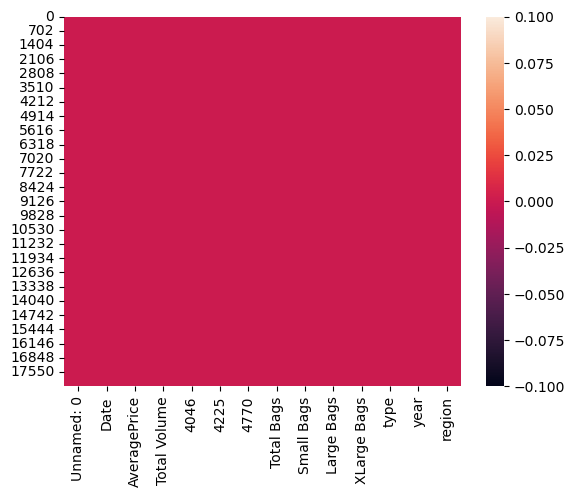

In [13]:
sns.heatmap(df.isnull())

Here we can see that there are no null values in the data set.

In [14]:
#Checking for duplicate values in the dataset-

In [15]:
df.duplicated().sum()

0

There are no duplicate values present in the data set.

In [16]:
#Checking no of unique values in each column-

In [17]:
df.nunique().to_frame('No of unique values')

,No of unique values
Unnamed: 0,53
Date,169
AveragePrice,259
Total Volume,18237
4046,17702
4225,18103
4770,12071
Total Bags,18097
Small Bags,17321
Large Bags,15082


In [18]:
#Lets check the value count of the dataset-

In [19]:
for i in df.columns:
    print(df[i].value_counts())
    print('\n')

0     432
7     432
1     432
11    432
9     432
8     432
10    432
6     432
5     432
4     432
3     432
2     432
41    324
34    324
35    324
36    324
37    324
38    324
39    324
40    324
47    324
42    324
43    324
44    324
45    324
46    324
32    324
48    324
49    324
50    324
33    324
26    324
31    324
30    324
12    324
13    324
14    324
15    324
16    324
17    324
18    324
19    324
20    324
21    324
22    324
23    324
24    324
25    324
27    324
28    324
29    324
51    322
52    107
Name: Unnamed: 0, dtype: int64


2015-12-27    108
2017-12-24    108
2017-12-10    108
2017-12-03    108
2017-11-26    108
             ... 
2016-11-06    108
2018-01-07    108
2017-06-18    107
2017-06-25    107
2015-12-06    107
Name: Date, Length: 169, dtype: int64


1.15    202
1.18    199
1.08    194
1.26    193
1.13    192
       ... 
3.25      1
3.12      1
2.68      1
3.03      1
3.17      1
Name: AveragePrice, Length: 259, dtype: int64


4103.97       2
352

In [20]:
#Convert date time format-

In [21]:
df['Date']=pd.to_datetime(df.Date,format='%Y-%m-%d')

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Unnamed: 0    18249 non-null  int64         
 1   Date          18249 non-null  datetime64[ns]
 2   AveragePrice  18249 non-null  float64       
 3   Total Volume  18249 non-null  float64       
 4   4046          18249 non-null  float64       
 5   4225          18249 non-null  float64       
 6   4770          18249 non-null  float64       
 7   Total Bags    18249 non-null  float64       
 8   Small Bags    18249 non-null  float64       
 9   Large Bags    18249 non-null  float64       
 10  XLarge Bags   18249 non-null  float64       
 11  type          18249 non-null  object        
 12  year          18249 non-null  int64         
 13  region        18249 non-null  object        
dtypes: datetime64[ns](1), float64(9), int64(2), object(2)
memory usage: 1.9+ MB


Now we can see that Date column is converted to date time format.

In [23]:
df.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [24]:
#Separating object data columns-

In [25]:
object=[]

for i in df.columns:
    if df[i].dtype=='object':
        object.append(i)

In [26]:
object

['type', 'region']

In [27]:
#Lets separate month & day from the date for our analysis-

In [28]:
df['Date']=pd.to_datetime(df['Date'])
df['Month']=df['Date'].apply(lambda x:x.month)
df['Day']=df['Date'].apply(lambda x:x.day)
df.head(25)

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.00,conventional,2015,Albany,12,27
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.00,conventional,2015,Albany,12,20
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.00,conventional,2015,Albany,12,13
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.00,conventional,2015,Albany,12,6
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.00,conventional,2015,Albany,11,29
5,5,2015-11-22,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.00,conventional,2015,Albany,11,22
6,6,2015-11-15,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.00,conventional,2015,Albany,11,15
7,7,2015-11-08,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.00,conventional,2015,Albany,11,8
8,8,2015-11-01,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.00,conventional,2015,Albany,11,1
9,9,2015-10-25,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.00,conventional,2015,Albany,10,25


In [29]:
#Lets drop Unnamed: 0 column as it is just an index no column only so we can drop it.

In [30]:
df=df.drop(columns=['Unnamed: 0'],axis=1)
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico,2,4
18245,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico,1,28
18246,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico,1,21
18247,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico,1,14


# Data Statistics-

In [31]:
df.describe()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Month,Day
count,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000,18249.000000,18249.000000
mean,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,2016.147899,6.177215,15.662612
std,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.939938,3.534130,8.776281
min,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000,1.000000,1.000000
25%,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,2015.000000,3.000000,8.000000
50%,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,2016.000000,6.000000,16.000000
75%,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,2017.000000,9.000000,23.000000
max,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,2018.000000,12.000000,31.000000


<AxesSubplot:>

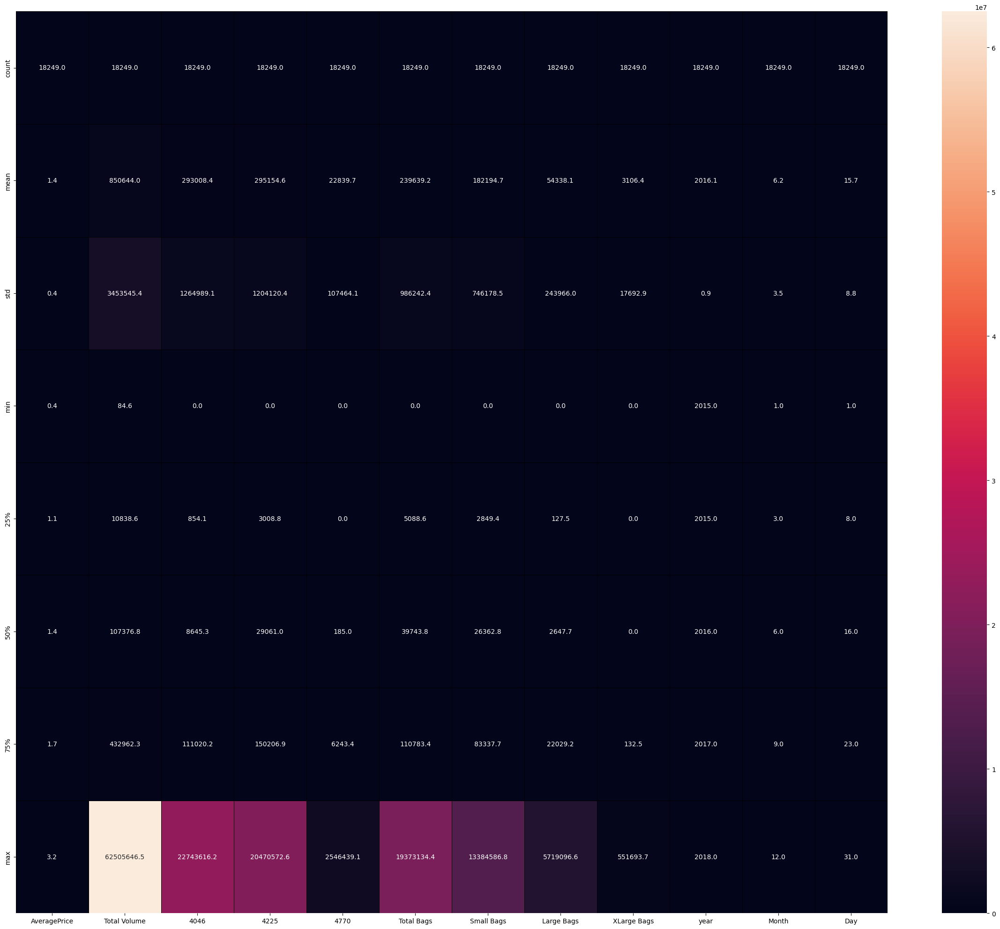

In [32]:
plt.figure(figsize=(30,25))
sns.heatmap(df.describe(),annot=True,fmt='.1f',linecolor='black',linewidth=0.5)

Observations-

1. The count of all the columns is same so we can say that no null values present in the data set.
2. In Columns total volume,4225,4770,large bags,xlarge bags having mean higher than the median so there may be right skewed data in this column.
3. In Columns 4046,totalbags,smallbags having median is greater than the mean so there may be left skewed data in these columns.
4. In columns totalvolume,4770,small bags,large bags,xlbags there is a huge gap bw 75% & maximum value so there may be outliers in these columns.

# Exploratory data analysis-

# Univariate analysis-

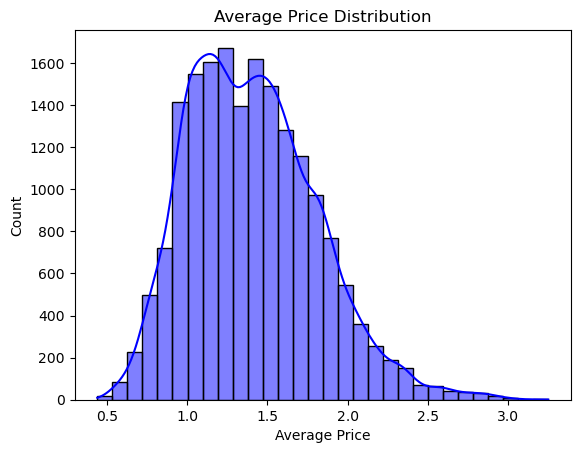

In [33]:
sns.histplot(df['AveragePrice'],color="blue",bins=30,kde=True)
plt.xlabel("Average Price")
plt.title("Average Price Distribution")
plt.show()

From the above graph it looks like the ditribution of average price is rightly skewed.

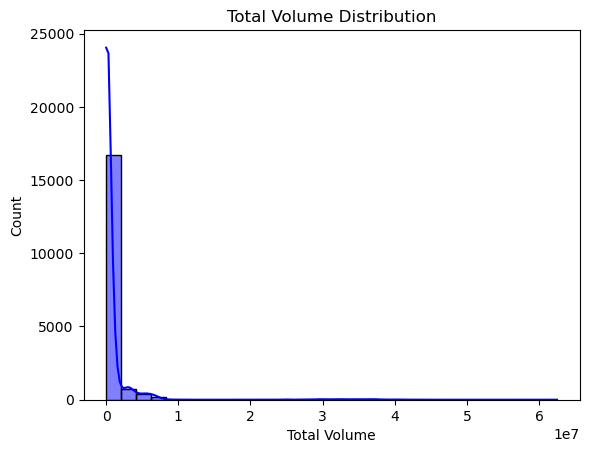

In [34]:
sns.histplot(df['Total Volume'],color="blue",bins=30,kde=True)
plt.xlabel("Total Volume")
plt.title("Total Volume Distribution")
plt.show()

The total volumn column data distribution looks highly right skewed.

<AxesSubplot:xlabel='type', ylabel='count'>

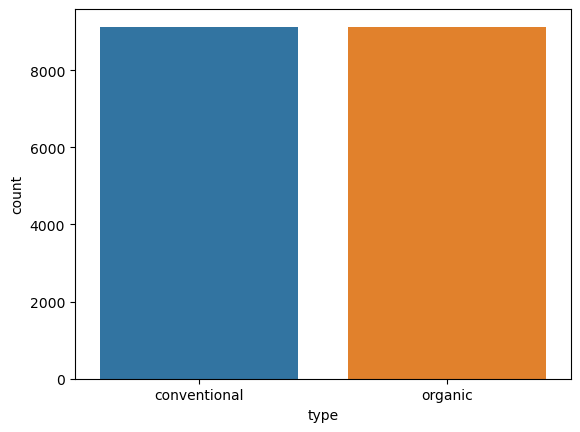

In [35]:
sns.countplot(df['type'])

The count of both type of avocado are same.

<AxesSubplot:xlabel='year', ylabel='count'>

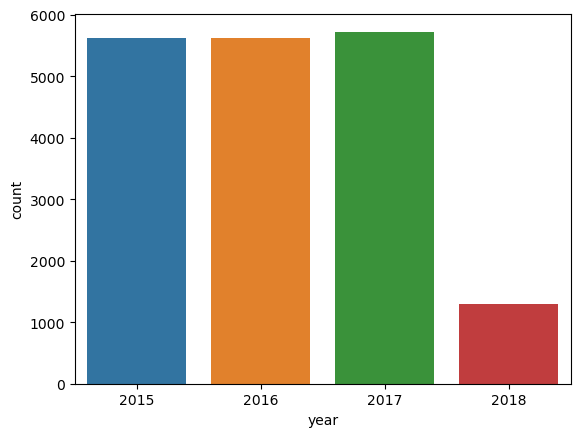

In [36]:
sns.countplot(df['year'])

The data set has most data from the 2017 year & least with 2018 year.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53]),
 [Text(0, 0, 'Albany'),
  Text(1, 0, 'Atlanta'),
  Text(2, 0, 'BaltimoreWashington'),
  Text(3, 0, 'Boise'),
  Text(4, 0, 'Boston'),
  Text(5, 0, 'BuffaloRochester'),
  Text(6, 0, 'California'),
  Text(7, 0, 'Charlotte'),
  Text(8, 0, 'Chicago'),
  Text(9, 0, 'CincinnatiDayton'),
  Text(10, 0, 'Columbus'),
  Text(11, 0, 'DallasFtWorth'),
  Text(12, 0, 'Denver'),
  Text(13, 0, 'Detroit'),
  Text(14, 0, 'GrandRapids'),
  Text(15, 0, 'GreatLakes'),
  Text(16, 0, 'HarrisburgScranton'),
  Text(17, 0, 'HartfordSpringfield'),
  Text(18, 0, 'Houston'),
  Text(19, 0, 'Indianapolis'),
  Text(20, 0, 'Jacksonville'),
  Text(21, 0, 'LasVegas'),
  Text(22, 0, 'LosAngeles'),
  Text(23, 0, 'Louisville'),
  Text(24, 0, 'MiamiFtLauderdale'),
  Text(25, 0, 'M

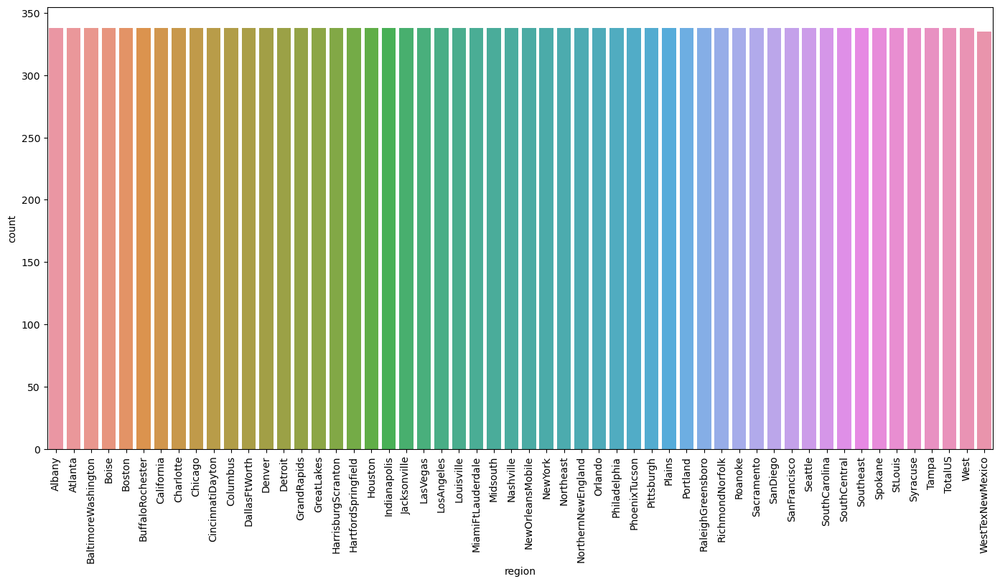

In [37]:
plt.figure(figsize=(17,8),dpi=100)
sns.countplot(df['region'])
plt.xticks(rotation=90)

The count of all the region in the data set is almost the same.

# Bivariate analysis-

Text(0.5, 1.0, 'Month vs Average Price')

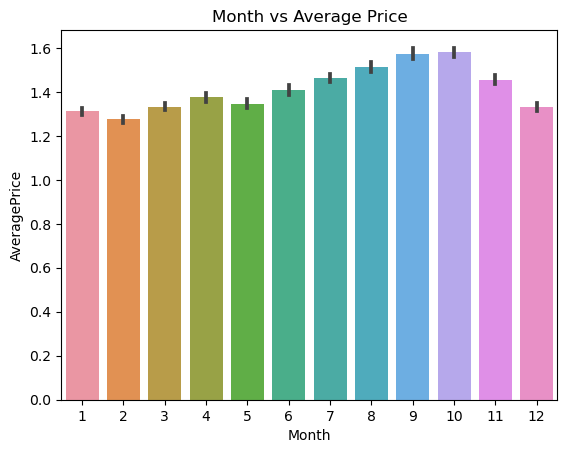

In [38]:
sns.barplot(x='Month',y='AveragePrice',data=df)
plt.title('Month vs Average Price')

The month vs Average price relation can be seen over the above graph. The average price is at its peak in septembar & october and lowest in feburary.

In [39]:
t=df.groupby("Month").mean()
t

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Day
Month,,,,,,,,,,,
1,1.311019,9.035654e+05,297091.451924,328309.637593,23469.554733,254693.975550,190706.250520,61666.720267,2321.004763,2016.500000,16.000000
2,1.274387,1.018825e+06,356672.920885,348558.374931,28394.881146,285196.078073,213055.035712,68894.364792,3246.677569,2016.500000,14.750000
3,1.332255,8.845054e+05,305386.962173,294504.626585,24952.196558,259658.362021,201308.615027,55152.129385,3197.617609,2016.411765,15.352941
4,1.374380,8.801935e+05,314698.492251,291711.817500,25904.380947,247878.811068,189665.529252,55711.218697,2502.063120,2016.076923,15.076923
5,1.346601,9.727150e+05,349946.910390,336679.188056,28377.930767,257710.995238,193425.140708,61144.593591,3141.260939,2015.928571,16.428571
6,1.408964,9.293397e+05,337007.417141,302172.503879,28951.149985,261208.611175,202713.415943,53218.635417,5276.559815,2015.998454,15.824575
7,1.462077,8.590482e+05,292245.798466,294714.809451,24521.787639,247558.728228,193294.104643,47831.054795,6433.567467,2016.071429,16.214286
8,1.512514,8.036857e+05,290614.959295,282362.133625,19615.213554,211092.107201,166253.229174,41272.813348,3566.063967,2015.923077,16.615385
9,1.572654,7.533192e+05,258561.835085,275712.053642,17425.176389,201618.164769,154073.842739,45327.096898,2217.225131,2016.000000,14.833333


Text(0.5, 1.0, 'trend of average price in different months')

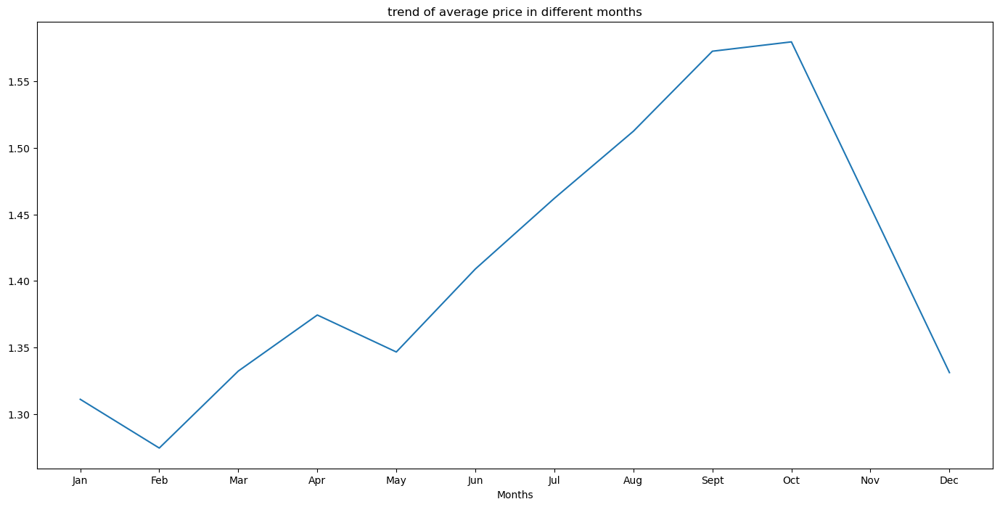

In [40]:
plt.figure(figsize=(17,8),dpi=100)
plt.plot(["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sept","Oct","Nov","Dec"],t['AveragePrice'])
plt.xlabel('Months')
plt.title('trend of average price in different months')

Text(0.5, 1.0, 'month vs AveragePrice')

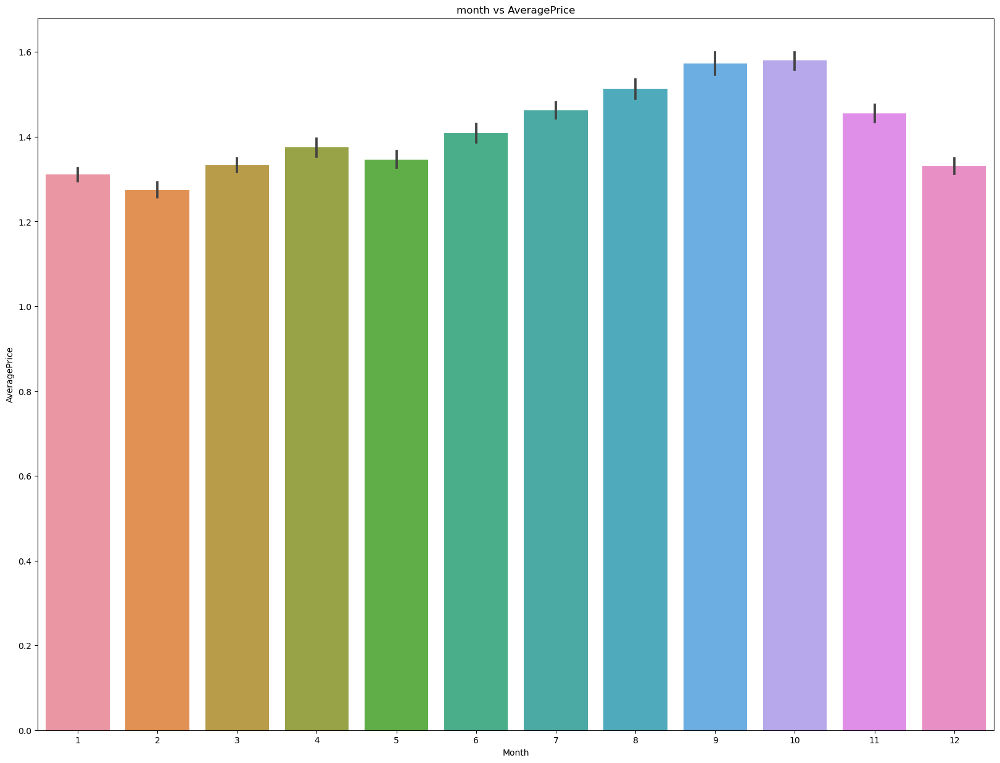

In [41]:
plt.figure(figsize=(20,15))
sns.barplot(x='Month',y='AveragePrice',data=df)
plt.title('month vs AveragePrice')

The average price is at its peak in septembar & october and lowest in feburary.the average price of avocado starts increasing highly after may to mid of novermber. it keep increasing till mid of november.

In [42]:
#Correlation of target variable with features-

In [43]:
df.corr()['AveragePrice'].sort_values(ascending=False)

AveragePrice    1.000000
Month           0.162409
year            0.093197
Day             0.027386
XLarge Bags    -0.117592
4225           -0.172928
Large Bags     -0.172940
Small Bags     -0.174730
Total Bags     -0.177088
4770           -0.179446
Total Volume   -0.192752
4046           -0.208317
Name: AveragePrice, dtype: float64

In [44]:
g=df.groupby('region').mean()
g

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Month,Day
region,,,,,,,,,,,,
Albany,1.561036,4.753787e+04,1.824082e+03,3.762121e+04,162.832337,7.929747e+03,6.647765e+03,1.153496e+03,128.488639,2016.147929,6.177515,15.662722
Atlanta,1.337959,2.621453e+05,1.461169e+05,3.121851e+04,311.385769,8.449856e+04,5.160573e+04,3.207004e+04,822.786036,2016.147929,6.177515,15.662722
BaltimoreWashington,1.534231,3.985619e+05,3.565622e+04,2.459829e+05,12466.730976,1.044561e+05,1.009397e+05,2.903985e+03,612.382722,2016.147929,6.177515,15.662722
Boise,1.348136,4.264257e+04,2.001951e+04,3.461682e+03,3186.787840,1.597459e+04,1.384004e+04,2.103634e+03,30.915207,2016.147929,6.177515,15.662722
Boston,1.530888,2.877929e+05,4.994610e+03,2.142199e+05,4982.294970,6.359609e+04,5.890659e+04,4.438365e+03,251.124231,2016.147929,6.177515,15.662722
BuffaloRochester,1.516834,6.793630e+04,1.776671e+03,3.166395e+04,144.335976,3.435134e+04,3.037998e+04,3.729050e+03,242.313432,2016.147929,6.177515,15.662722
California,1.395325,3.044324e+06,1.180376e+06,1.039915e+06,94204.276746,7.298290e+05,6.778038e+05,3.642585e+04,15599.342929,2016.147929,6.177515,15.662722
Charlotte,1.606036,1.051939e+05,2.237814e+04,3.662802e+04,11578.467574,3.460930e+04,3.149069e+04,2.912684e+03,205.927781,2016.147929,6.177515,15.662722
Chicago,1.556775,3.955690e+05,3.208308e+04,2.545190e+05,59069.204290,4.989763e+04,4.377116e+04,5.005547e+03,1120.925178,2016.147929,6.177515,15.662722


In [45]:
g.sort_values(by=['AveragePrice'],ascending=False,inplace=True)
g

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Month,Day
region,,,,,,,,,,,,
HartfordSpringfield,1.818639,1.499128e+05,3.904301e+03,1.119752e+05,503.708994,3.352962e+04,3.188923e+04,1.410794e+03,229.590888,2016.147929,6.177515,15.662722
SanFrancisco,1.804201,4.018645e+05,1.009967e+05,2.460150e+05,10796.791361,4.405599e+04,4.290636e+04,5.234889e+02,626.137840,2016.147929,6.177515,15.662722
NewYork,1.727574,7.122311e+05,2.260156e+04,4.832954e+05,5168.053580,2.011661e+05,1.727860e+05,2.731656e+04,1063.543432,2016.147929,6.177515,15.662722
Philadelphia,1.632130,2.125408e+05,1.365444e+04,1.264747e+05,1774.944053,7.063678e+04,6.336398e+04,6.958744e+03,314.058343,2016.147929,6.177515,15.662722
Sacramento,1.621568,2.223779e+05,6.938285e+04,1.218252e+05,4595.151893,2.657476e+04,2.573030e+04,2.269676e+02,617.488491,2016.147929,6.177515,15.662722
Charlotte,1.606036,1.051939e+05,2.237814e+04,3.662802e+04,11578.467574,3.460930e+04,3.149069e+04,2.912684e+03,205.927781,2016.147929,6.177515,15.662722
Northeast,1.601923,2.110299e+06,1.035243e+05,1.403801e+06,20167.587692,5.828059e+05,5.136774e+05,6.525460e+04,3873.868521,2016.147929,6.177515,15.662722
Albany,1.561036,4.753787e+04,1.824082e+03,3.762121e+04,162.832337,7.929747e+03,6.647765e+03,1.153496e+03,128.488639,2016.147929,6.177515,15.662722
Chicago,1.556775,3.955690e+05,3.208308e+04,2.545190e+05,59069.204290,4.989763e+04,4.377116e+04,5.005547e+03,1120.925178,2016.147929,6.177515,15.662722


Text(0.5, 1.0, 'Region vs Average Price')

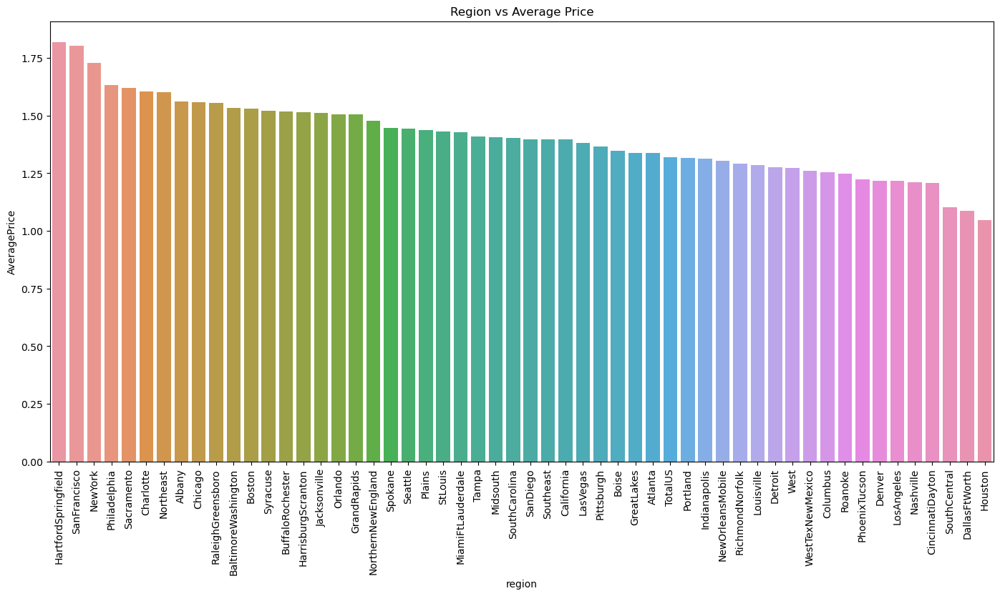

In [46]:
plt.figure(figsize=(17,8),dpi=100)
sns.barplot(x=g.index,y=g['AveragePrice'],data=g)
plt.xticks(rotation=90)
plt.title( 'Region vs Average Price')

From the above plot we can see that avearge price for avocado is highest in regions like HartfordSpringfield and lowest for Houston.

In [47]:
k=df.groupby("year").mean()
k

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,Month,Day
year,,,,,,,,,,,
2015,1.375590,7.810274e+05,304443.451708,313633.844367,25426.962520,137523.105437,113033.429256,23520.285037,969.390611,6.518255,15.443989
2016,1.338640,8.584206e+05,271567.466578,297850.478632,28468.633371,260533.986204,197025.327568,59940.587974,3568.070662,6.442308,15.942308
2017,1.515128,8.623393e+05,288716.905194,269964.124350,15941.542779,287712.119423,213728.158838,69790.115367,4193.843471,6.528487,15.639462
2018,1.347531,1.066928e+06,355323.868904,314628.606698,17694.903387,379271.564429,278349.820795,95358.015340,5563.728295,2.000000,15.500000


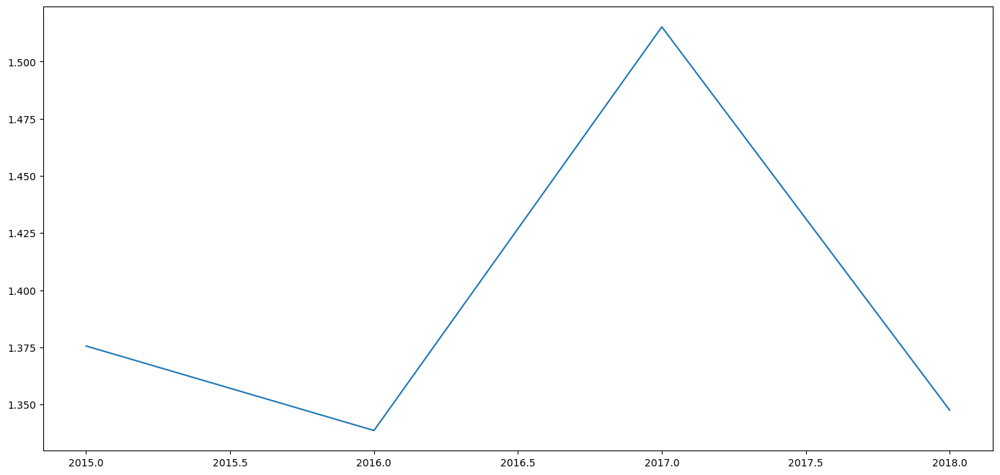

In [48]:
plt.figure(figsize=(17,8),dpi=100)
plt.plot(k.index,k['AveragePrice'])

from years 2015 to 2016 the average price of avocado is decreasing and after 2016 to 2017 we can see the high increase in the average price of avocado and again after 2017 to 2018 we can see the decrease in the average price of avocado.

Text(0.5, 1.0, 'month vs AveragePrice')

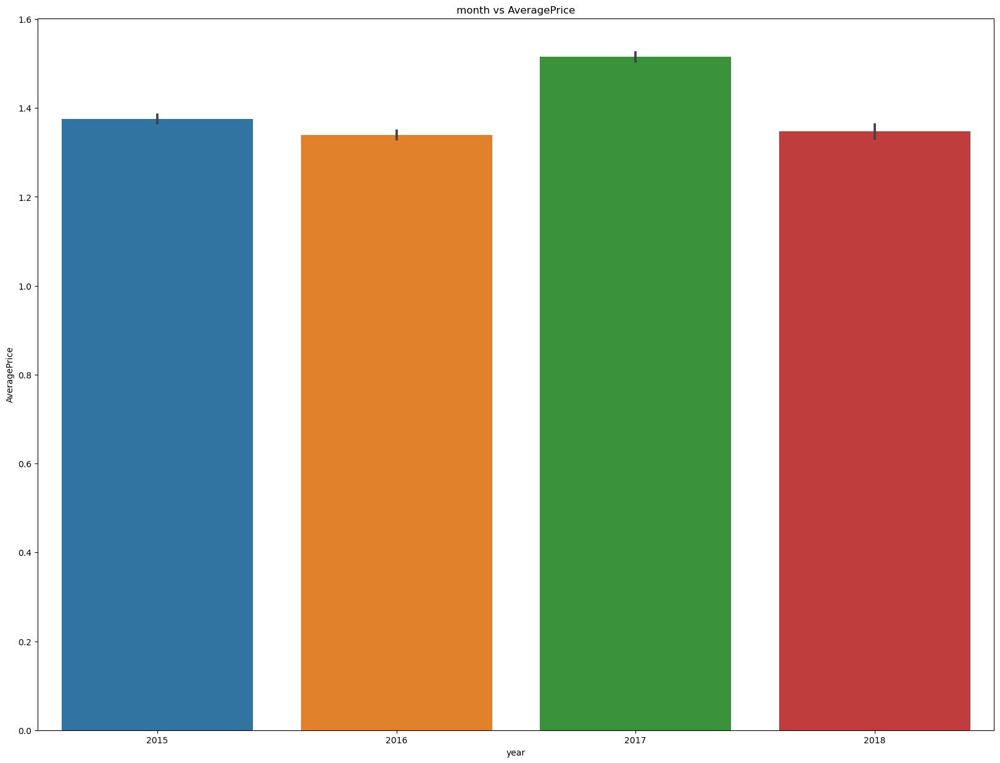

In [49]:
plt.figure(figsize=(20,15))
sns.barplot(x='year',y='AveragePrice',data=df)
plt.title('month vs AveragePrice')

1. Average price of avacado is highest in 2016 year.    
2. Here we can say that in 2017 year the average price of avaocado is very high.

In [50]:
s=df.groupby("type").mean()
s

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Month,Day
type,,,,,,,,,,,,
conventional,1.158040,1.653213e+06,578611.649925,574805.318859,45405.796798,454390.130901,346721.795885,101457.698855,6210.635065,2016.147929,6.177515,15.662722
organic,1.653999,4.781121e+04,7311.281600,15411.857724,266.254582,24817.654696,17613.474543,7202.982659,1.197164,2016.147868,6.176915,15.662501


<AxesSubplot:xlabel='type', ylabel='AveragePrice'>

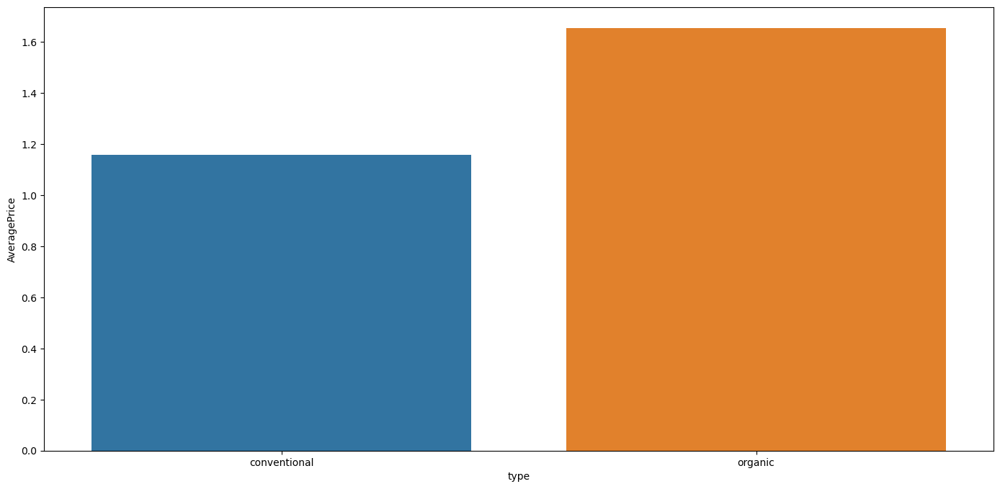

In [51]:
plt.figure(figsize=(17,8),dpi=100)
sns.barplot(x=s.index,y=s.AveragePrice,data=s)

The average price of organic type avocado is higher than the conventional type.

Text(0.5, 1.0, 'TotalVolume vs AveragePrice')

<Figure size 2000x1500 with 0 Axes>

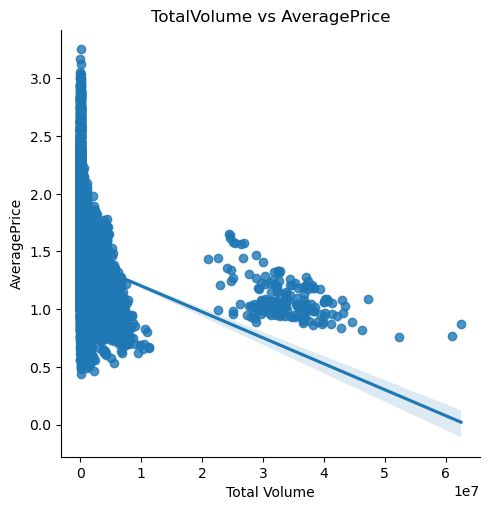

In [52]:
plt.figure(figsize=(20,15))
sns.lmplot(x='Total Volume',y='AveragePrice',data=df)
plt.title('TotalVolume vs AveragePrice')

The average price & Totalvolume has negetive correlationship with each other.

Text(0.5, 1.0, 'Total number of avocados with PLU 4046 sold vs AveragePrice')

<Figure size 2000x1500 with 0 Axes>

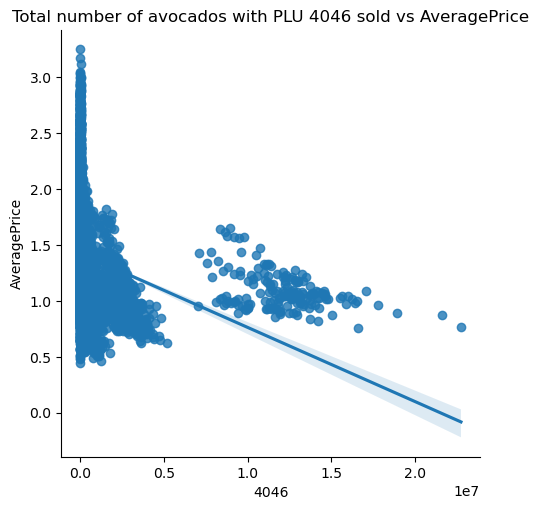

In [53]:
plt.figure(figsize=(20,15))
sns.lmplot(x='4046',y='AveragePrice',data=df)
plt.title('Total number of avocados with PLU 4046 sold vs AveragePrice')

Total number of avocados with PLU 4046 sold & AveragePrice of avocado has negetive correlationship with each other.

Text(0.5, 1.0, 'Total number of avocados with PLU 4225 sold vs AveragePrice')

<Figure size 2000x1500 with 0 Axes>

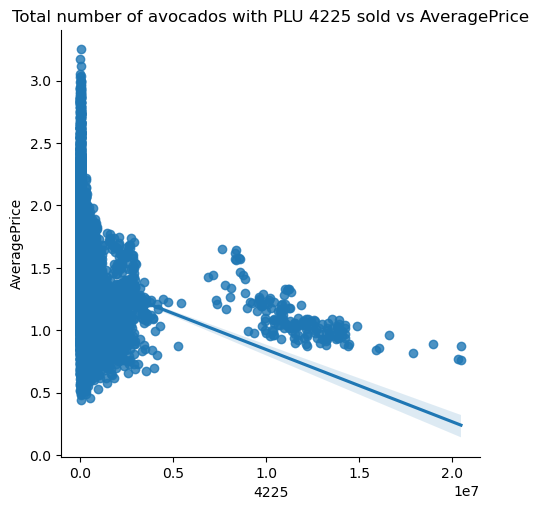

In [54]:
plt.figure(figsize=(20,15))
sns.lmplot(x='4225',y='AveragePrice',data=df)
plt.title('Total number of avocados with PLU 4225 sold vs AveragePrice')

Total number of avocados with PLU 4225 sold & AveragePrice has Negetive correlationship with each other.

Text(0.5, 1.0, 'Total number of avocados with PLU 4770 sold vs AveragePrice')

<Figure size 2000x1500 with 0 Axes>

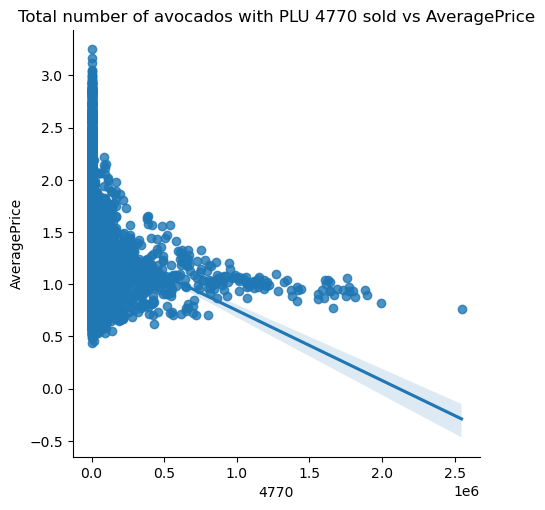

In [55]:
plt.figure(figsize=(20,15))
sns.lmplot(x='4770',y='AveragePrice',data=df)
plt.title('Total number of avocados with PLU 4770 sold vs AveragePrice')

Total number of avocados with PLU 4770 sold & AveragePrice has Negetive correlationship with each other.

Text(0.5, 1.0, 'Total Bags vs AveragePrice')

<Figure size 2000x1500 with 0 Axes>

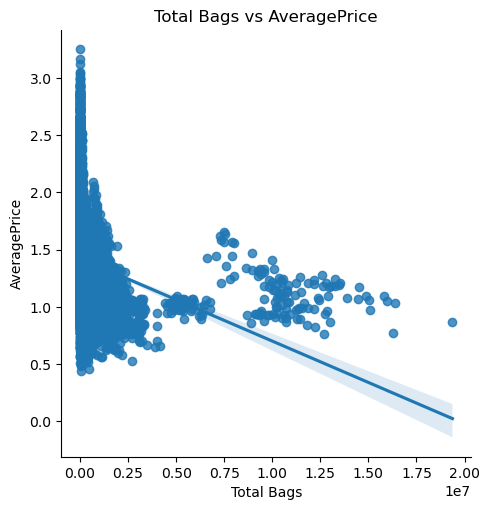

In [56]:
plt.figure(figsize=(20,15))
sns.lmplot(x='Total Bags',y='AveragePrice',data=df)
plt.title('Total Bags vs AveragePrice')

Total Bags & AveragePrice has Negetive correlationship with each other.

Text(0.5, 1.0, 'Small Bags vs AveragePrice')

<Figure size 2000x1500 with 0 Axes>

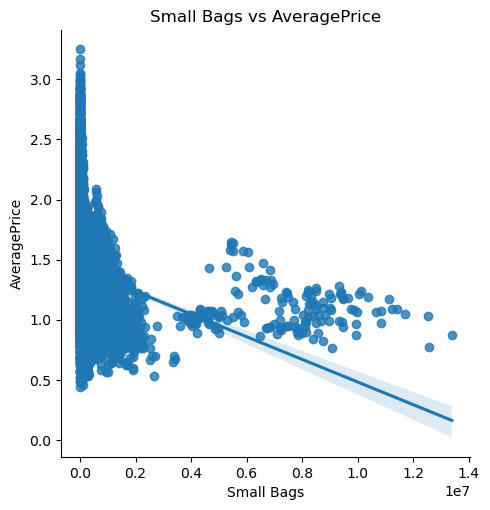

In [57]:
plt.figure(figsize=(20,15))
sns.lmplot(x='Small Bags',y='AveragePrice',data=df)
plt.title('Small Bags vs AveragePrice')

Small Bags & AveragePrice has negetive correlationship with each other.

Text(0.5, 1.0, 'Large Bags vs AveragePrice')

<Figure size 2000x1500 with 0 Axes>

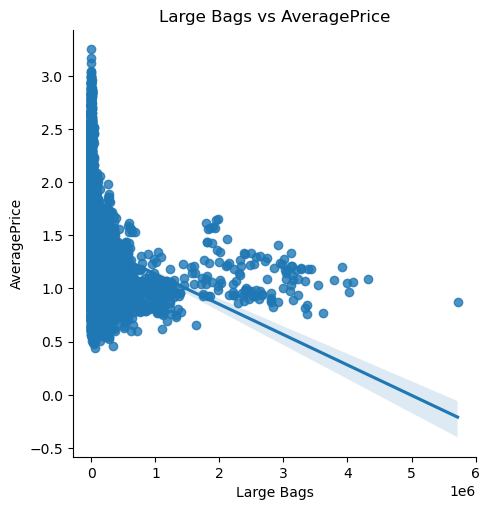

In [58]:
plt.figure(figsize=(20,15))
sns.lmplot(x='Large Bags',y='AveragePrice',data=df)
plt.title('Large Bags vs AveragePrice')

LargeBags & AveragePrice has negetive correlationship with each other.

Text(0.5, 1.0, 'XLarge Bags vs AveragePrice')

<Figure size 2000x1500 with 0 Axes>

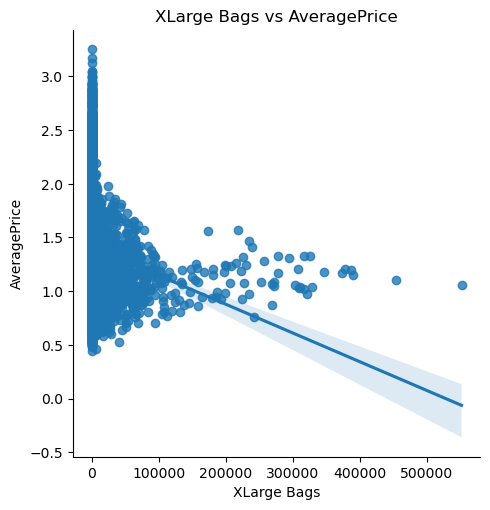

In [59]:
plt.figure(figsize=(20,15))
sns.lmplot(x='XLarge Bags',y='AveragePrice',data=df)
plt.title('XLarge Bags vs AveragePrice')

XLargeBags & AveragePrice has negetive correlationship with each other.

Text(0.5, 1.0, 'XLarge Bags vs AveragePrice')

<Figure size 2000x1500 with 0 Axes>

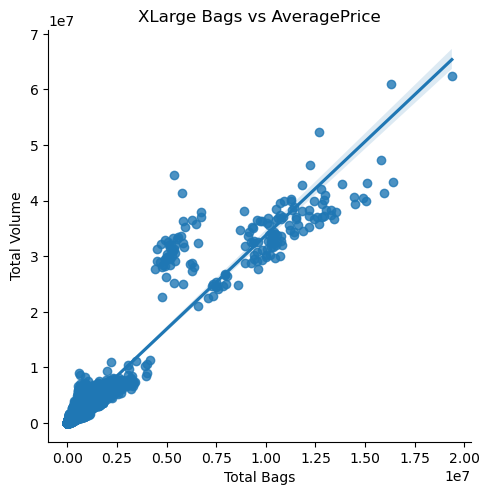

In [60]:
plt.figure(figsize=(20,15))
sns.lmplot(x='Total Bags',y='Total Volume',data=df)
plt.title('XLarge Bags vs AveragePrice')

TotalBags & AveragePrice has Positive correlationship with each other.

Text(0.5, 1.0, 'type vs TotalVolume')

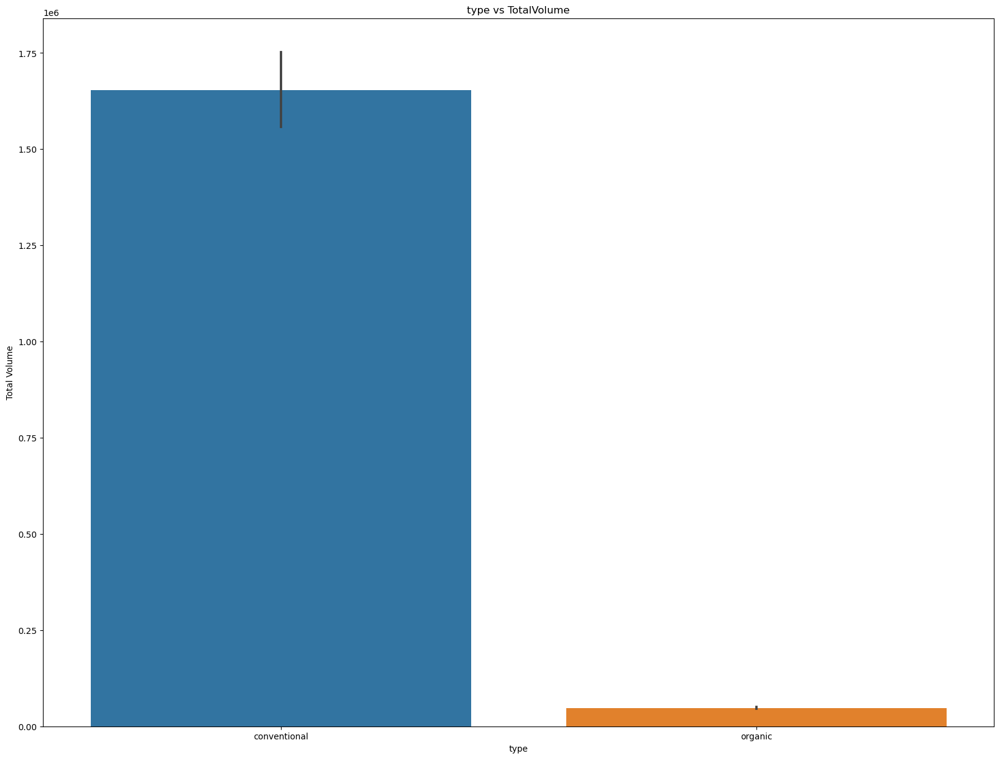

In [61]:
plt.figure(figsize=(20,15))
sns.barplot(x='type',y='Total Volume',data=df)
plt.title('type vs TotalVolume')

Conventional type of avocados sold higher than organic type.

Text(0.5, 1.0, 'year vs TotalVolume')

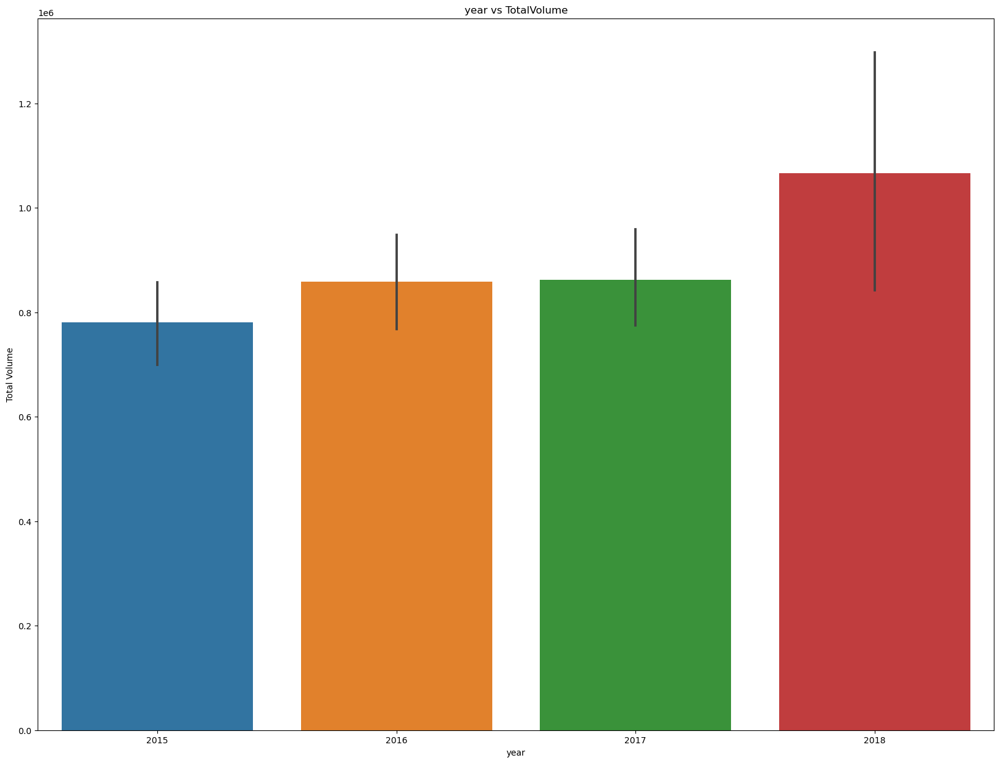

In [62]:
plt.figure(figsize=(20,15))
sns.barplot(x='year',y='Total Volume',data=df)
plt.title('year vs TotalVolume')

In 2018 year maximum volume of avacados sold.

Text(0.5, 1.0, 'Month vs TotalVolume')

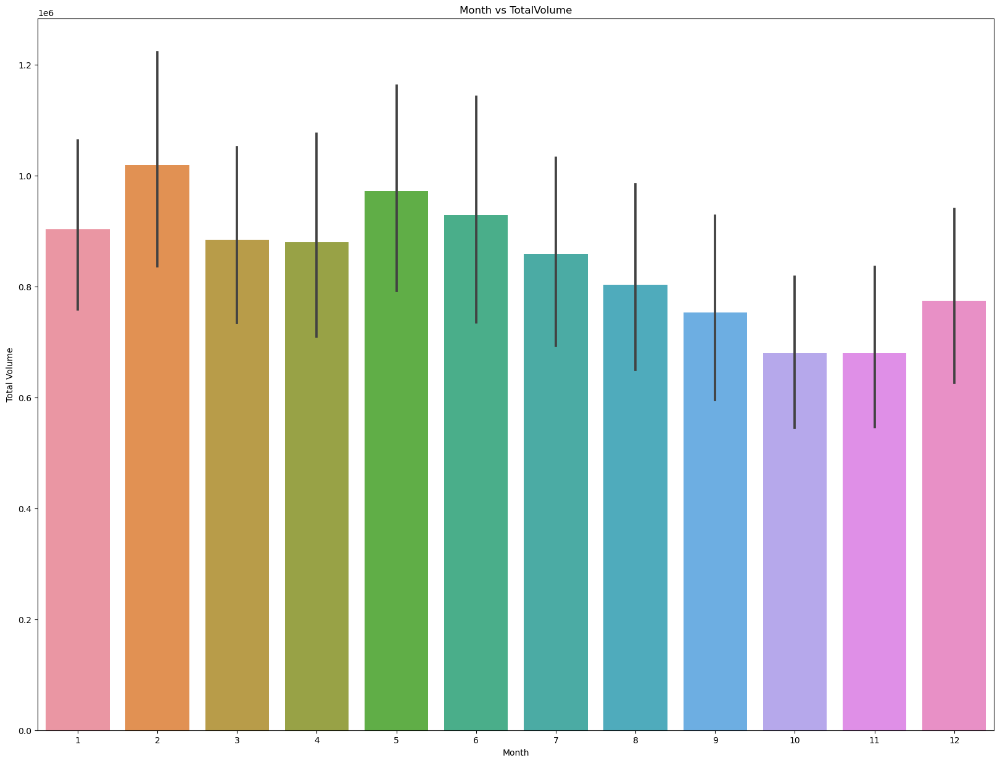

In [63]:
plt.figure(figsize=(20,15))
sns.barplot(x='Month',y='Total Volume',data=df)
plt.title('Month vs TotalVolume')

In Feburary month maximum volume of avocados sold & minimum volume of avocados sold in november month.

Text(0.5, 1.0, 'Month vs TotalVolume')

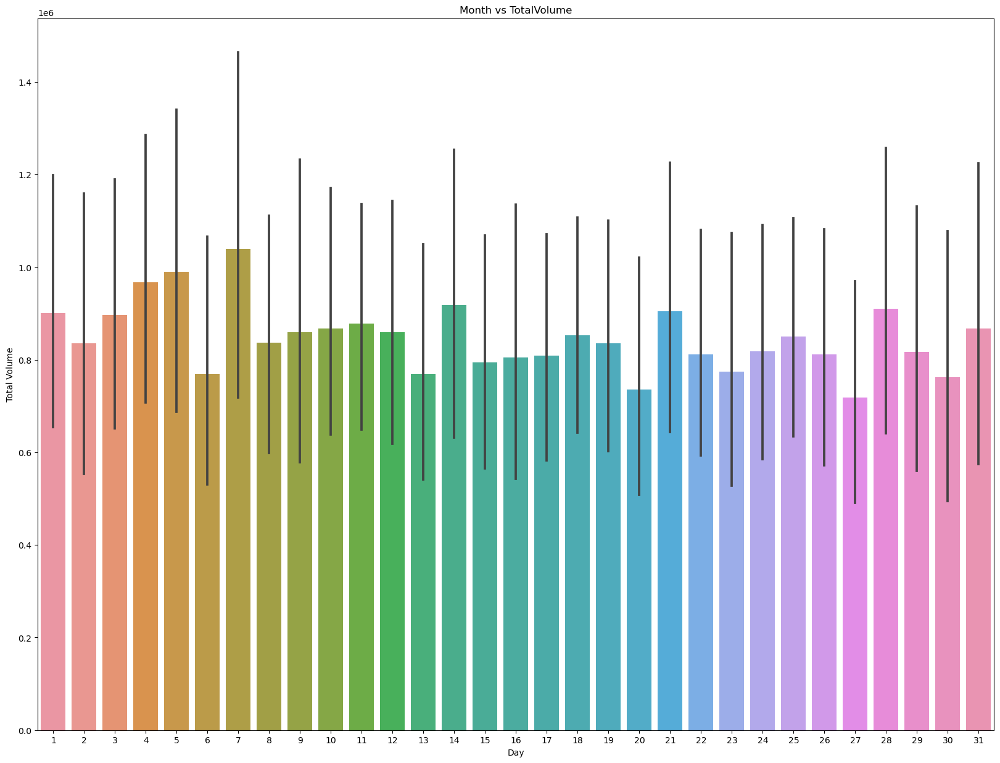

In [64]:
plt.figure(figsize=(20,15))
sns.barplot(x='Day',y='Total Volume',data=df)
plt.title('Month vs TotalVolume')

On 7th day of month maximum volume of avocados sold 

In [65]:
df['4046'].mean()

293008.42453066056

In [66]:
df['4225'].mean()

295154.56835607596

In [67]:
df['4770'].mean()

22839.735992657315

Here we can say that PLU4225 has been sold maximum than PLU4046 & PLU4770.

Text(0.5, 1.0, 'year vs TotalBags')

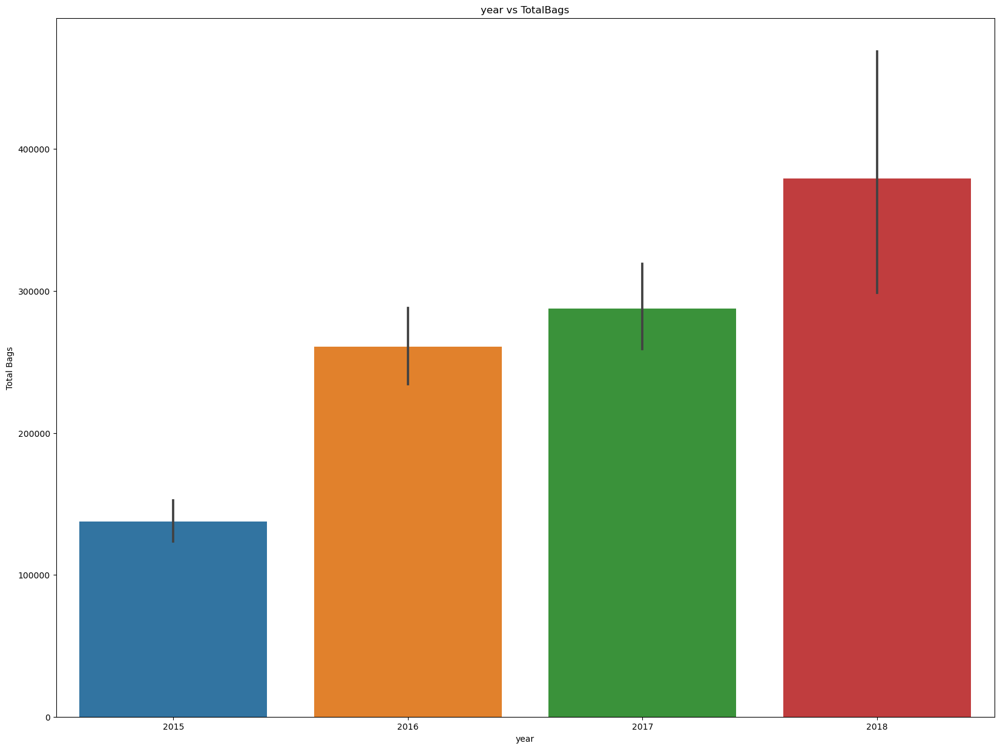

In [68]:
plt.figure(figsize=(20,15))
sns.barplot(x='year',y='Total Bags',data=df)
plt.title('year vs TotalBags')

Here it is very much clear as in 2018 maximum volume of avocados sold so maximum no of bags also used in 2018 & in 2015 there is very least sale of avocados so least bags used.

# Heatmap (Correlation matrics)-

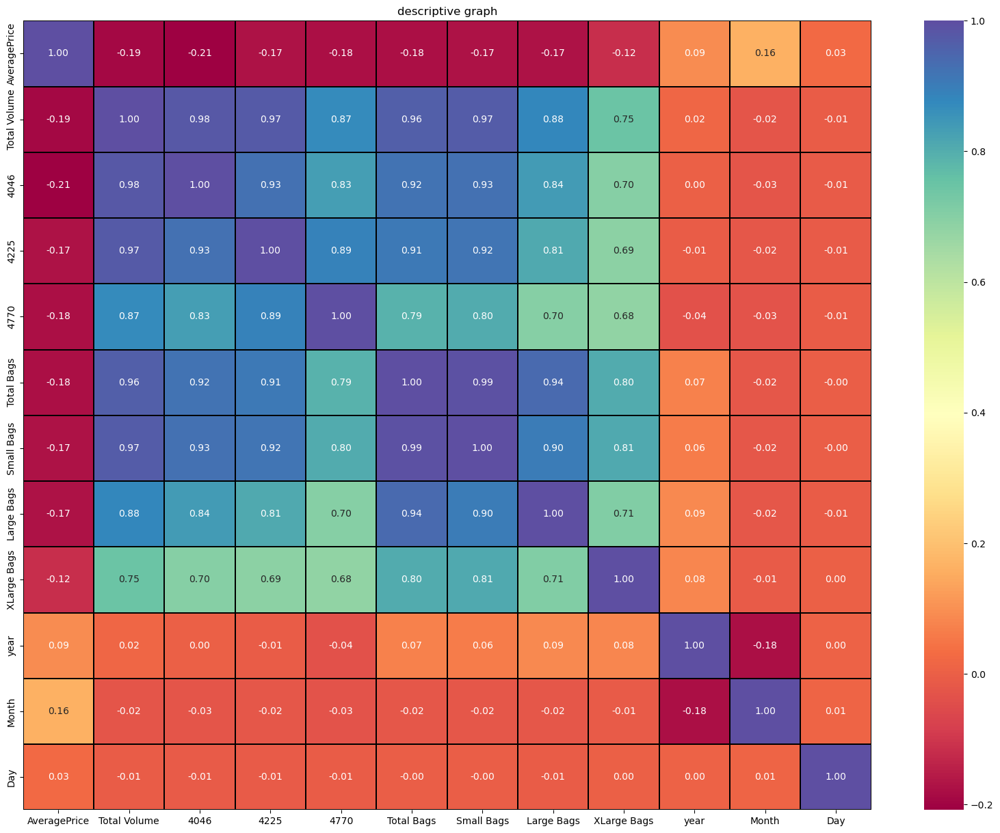

In [69]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),annot=True,fmt='0.2f',linewidth=0.2,linecolor='Black',cmap='Spectral')
plt.title('descriptive graph')
plt.show()

Observations-

1. Total volume & 4046 has 98% positive correlationship with each other.
2. Total volume & 4225 has 97% positive correlationship with each other.
3. Total volume & 4770 has 87% positive correlationship with each other.
4. Total volume & Total bags has 96% positive correlationship with each other.
5. Total volume & Small bags has 97% positive correlationship with each other.
6. Total volume & Large bags has 88% positive correlationship with each other.
7. 4046 & 4225 has 93% positive correlationship with each other.
8. Small bags & 4046 has 93% positive correlationship with each other.
9. Small bags & 4225 has 92% positive correlationship with each other.
10.Small bags & 4770 has 80% positive correlationship with each other.
11.Small bags & Total bags has 99% positive correlationship with each other.
12.Total basg & large bags has 94% positive correlationship with each other.

# Checking data distribution-

In [70]:
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,27
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,20
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,13
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,6
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico,2,4
18245,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico,1,28
18246,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico,1,21
18247,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico,1,14


In [71]:
x=df.drop(columns=['type','region'],axis=1)

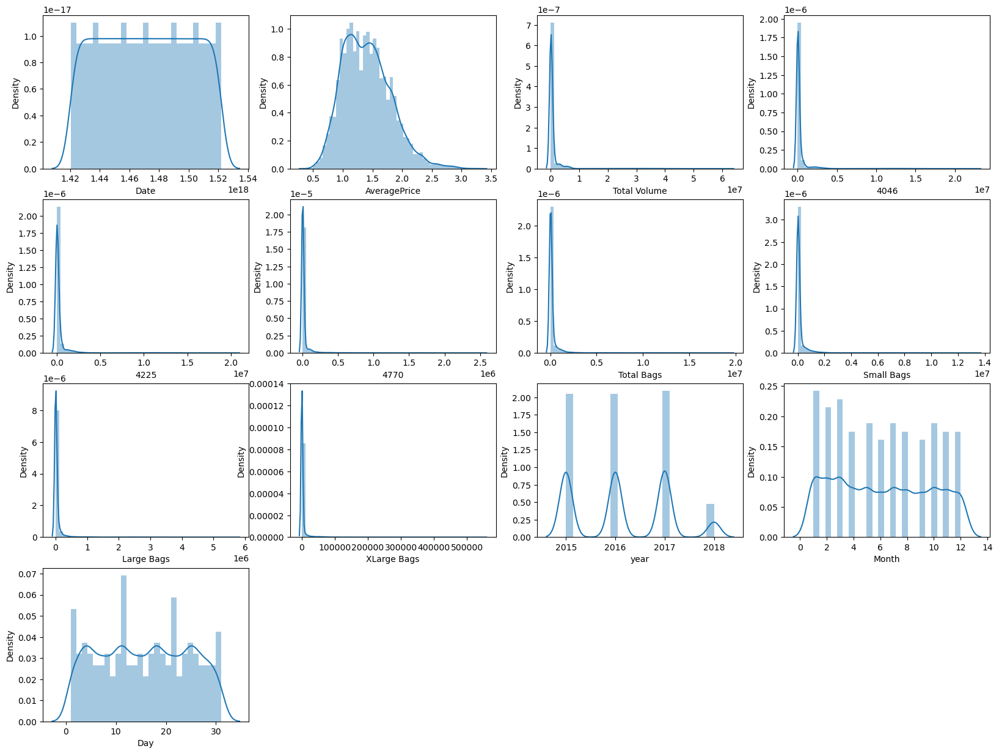

In [72]:
plt.figure(figsize=(20,15))
plotnumber=1


for column in x.columns:
    if plotnumber<=15:
        ax=plt.subplot(4,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column)
    plotnumber+=1   
plt.show()    

Here we can see that skewness is there in columns like TotalVolume,4046,4225,4770,smallbags,largebags,Xlargebags columns which we need to remove.

# Lets check skewness of data-

In [73]:
df.skew()

AveragePrice     0.580303
Total Volume     9.007687
4046             8.648220
4225             8.942466
4770            10.159396
Total Bags       9.756072
Small Bags       9.540660
Large Bags       9.796455
XLarge Bags     13.139751
year             0.215339
Month            0.106617
Day              0.014310
dtype: float64

We have cross checked the skewness and found that skewness is present in columns like TotalVolume,4046,4225,4770,smallbags,largebags,Xlargebags.

# Removal of skewness through Power transformer method-¶

In [74]:
from sklearn.preprocessing import PowerTransformer

In [75]:
#Separated the feature from which skewness needs to be removed-

In [76]:
features=['Total Volume','4046','4225','4770','Total Bags','Small Bags','Large Bags','XLarge Bags']

In [77]:
x=PowerTransformer(method='yeo-johnson') 
df[features]=x.fit_transform(df[features].values)

In [78]:
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,2015-12-27,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,Albany,12,27
1,2015-12-20,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,Albany,12,20
2,2015-12-13,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,Albany,12,13
3,2015-12-06,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,Albany,12,6
4,2015-11-29,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,WestTexNewMexico,2,4
18245,2018-01-28,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,WestTexNewMexico,1,28
18246,2018-01-21,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,WestTexNewMexico,1,21
18247,2018-01-14,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,WestTexNewMexico,1,14


In [79]:
#Lets check the distribution of data again after removal of skewness-

In [80]:
x=df.drop(columns=['type','region'],axis=1)

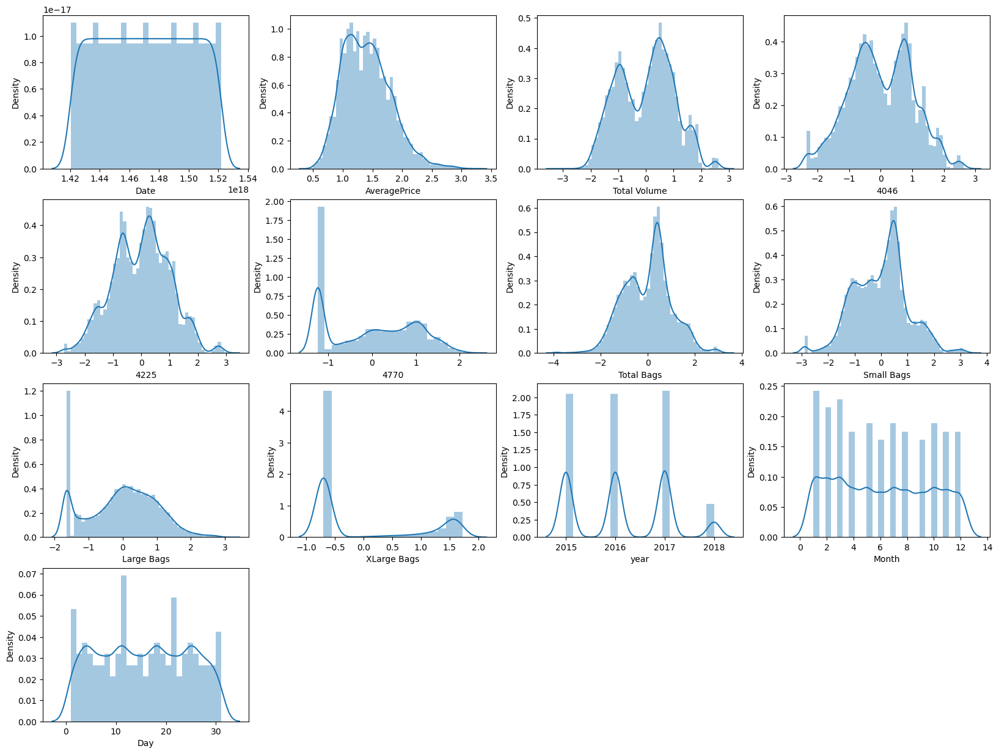

In [81]:
plt.figure(figsize=(20,15))
plotnumber=1


for column in x.columns:
    if plotnumber<=15:
        ax=plt.subplot(4,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column)
    plotnumber+=1   
plt.show()    

In [82]:
df.skew()

AveragePrice    0.580303
Total Volume    0.011171
4046           -0.022679
4225           -0.017740
4770            0.032184
Total Bags     -0.001626
Small Bags      0.007058
Large Bags     -0.073809
XLarge Bags     0.793520
year            0.215339
Month           0.106617
Day             0.014310
dtype: float64

Here we can say that skewness has been removed from the data set.

# Checking for outliers-

In [83]:
#Removing date & categorical and target variable columns-

In [84]:
x=df.drop(columns=['Date','type','region','AveragePrice'],axis=1)

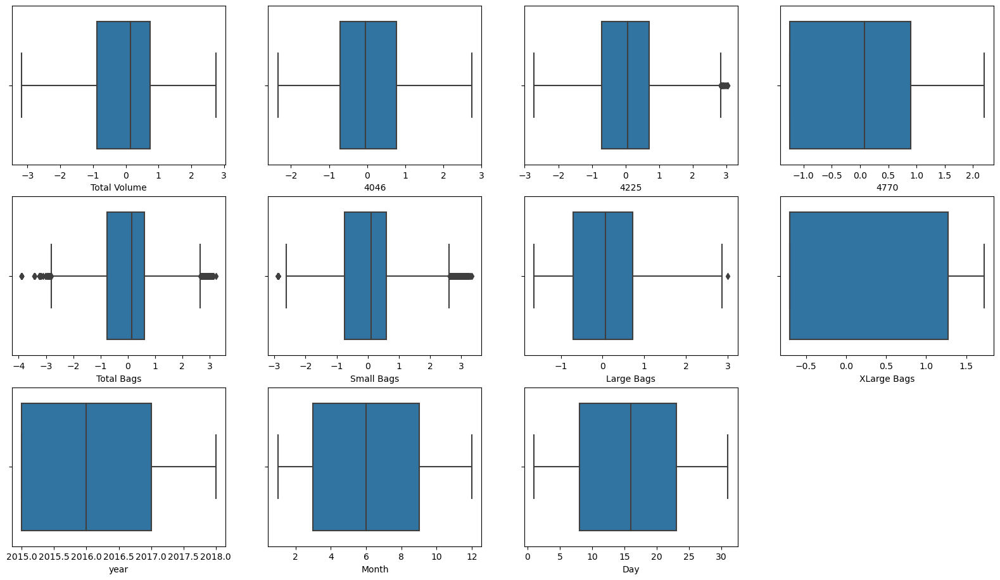

In [85]:
plt.figure(figsize=(20,15))
plotnumber=1


for column in x.columns:
    if plotnumber<=15:
        ax=plt.subplot(4,4,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column)
    plotnumber+=1   
plt.show()   

Here we can see that outliers present in 4225,Total Bags,Small Bags,Large Bags column.

# Outliers removal through IQR method-

In [86]:
#upper side outliers-q3+(1.5*IQR)
#lower side outliers-q1-(1.5*IQR)


q1=df.quantile(0.25)
q3=df.quantile(0.75)

IQR=q3-q1

In [87]:
#Removing upper outliers from 4225 column-

In [88]:
high_4225=(q3['4225']+(1.5*IQR['4225']))


index=np.where(df['4225']> high_4225)

df=df.drop(df.index[index])
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,2015-12-27,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,Albany,12,27
1,2015-12-20,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,Albany,12,20
2,2015-12-13,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,Albany,12,13
3,2015-12-06,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,Albany,12,6
4,2015-11-29,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,WestTexNewMexico,2,4
18245,2018-01-28,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,WestTexNewMexico,1,28
18246,2018-01-21,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,WestTexNewMexico,1,21
18247,2018-01-14,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,WestTexNewMexico,1,14


In [89]:
#Removing upper outliers from TotalBags column-

In [90]:
high_tb=(q3['Total Bags']+(1.5*IQR['Total Bags']))


index=np.where(df['Total Bags']> high_tb)

df=df.drop(df.index[index])
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,2015-12-27,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,Albany,12,27
1,2015-12-20,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,Albany,12,20
2,2015-12-13,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,Albany,12,13
3,2015-12-06,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,Albany,12,6
4,2015-11-29,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,WestTexNewMexico,2,4
18245,2018-01-28,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,WestTexNewMexico,1,28
18246,2018-01-21,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,WestTexNewMexico,1,21
18247,2018-01-14,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,WestTexNewMexico,1,14


In [91]:
#Removing upper outliers from smallBags column-

In [92]:
high_sb=(q3['Small Bags']+(1.5*IQR['Small Bags']))


index=np.where(df['Small Bags']> high_sb)

df=df.drop(df.index[index])
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,2015-12-27,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,Albany,12,27
1,2015-12-20,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,Albany,12,20
2,2015-12-13,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,Albany,12,13
3,2015-12-06,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,Albany,12,6
4,2015-11-29,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,WestTexNewMexico,2,4
18245,2018-01-28,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,WestTexNewMexico,1,28
18246,2018-01-21,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,WestTexNewMexico,1,21
18247,2018-01-14,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,WestTexNewMexico,1,14


In [93]:
#Removing upper outliers from Large Bags column-

In [94]:
high_lb=(q3['Large Bags']+(1.5*IQR['Large Bags']))


index=np.where(df['Large Bags']> high_lb)

df=df.drop(df.index[index])
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,2015-12-27,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,Albany,12,27
1,2015-12-20,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,Albany,12,20
2,2015-12-13,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,Albany,12,13
3,2015-12-06,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,Albany,12,6
4,2015-11-29,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,WestTexNewMexico,2,4
18245,2018-01-28,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,WestTexNewMexico,1,28
18246,2018-01-21,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,WestTexNewMexico,1,21
18247,2018-01-14,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,WestTexNewMexico,1,14


In [95]:
#Removing lower outliers from TotalBags column-

In [96]:
tb_low=q1['Total Bags']-(1.5*IQR['Total Bags'])

index=np.where(df['Total Bags']<tb_low)

df=df.drop(df.index[index])
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,2015-12-27,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,Albany,12,27
1,2015-12-20,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,Albany,12,20
2,2015-12-13,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,Albany,12,13
3,2015-12-06,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,Albany,12,6
4,2015-11-29,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,WestTexNewMexico,2,4
18245,2018-01-28,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,WestTexNewMexico,1,28
18246,2018-01-21,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,WestTexNewMexico,1,21
18247,2018-01-14,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,WestTexNewMexico,1,14


In [97]:
#Removing lower outliers from SmallBags column-

In [98]:
sb_low=q1['Small Bags']-(1.5*IQR['Small Bags'])

index=np.where(df['Small Bags']<sb_low)

df=df.drop(df.index[index])
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,2015-12-27,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,Albany,12,27
1,2015-12-20,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,Albany,12,20
2,2015-12-13,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,Albany,12,13
3,2015-12-06,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,Albany,12,6
4,2015-11-29,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,WestTexNewMexico,2,4
18245,2018-01-28,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,WestTexNewMexico,1,28
18246,2018-01-21,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,WestTexNewMexico,1,21
18247,2018-01-14,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,WestTexNewMexico,1,14


In [99]:
df.reset_index()

,index,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,0,2015-12-27,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,Albany,12,27
1,1,2015-12-20,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,Albany,12,20
2,2,2015-12-13,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,Albany,12,13
3,3,2015-12-06,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,Albany,12,6
4,4,2015-11-29,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17898,18244,2018-02-04,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,WestTexNewMexico,2,4
17899,18245,2018-01-28,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,WestTexNewMexico,1,28
17900,18246,2018-01-21,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,WestTexNewMexico,1,21
17901,18247,2018-01-14,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,WestTexNewMexico,1,14


In [100]:
#Checking for outliers again after removal-

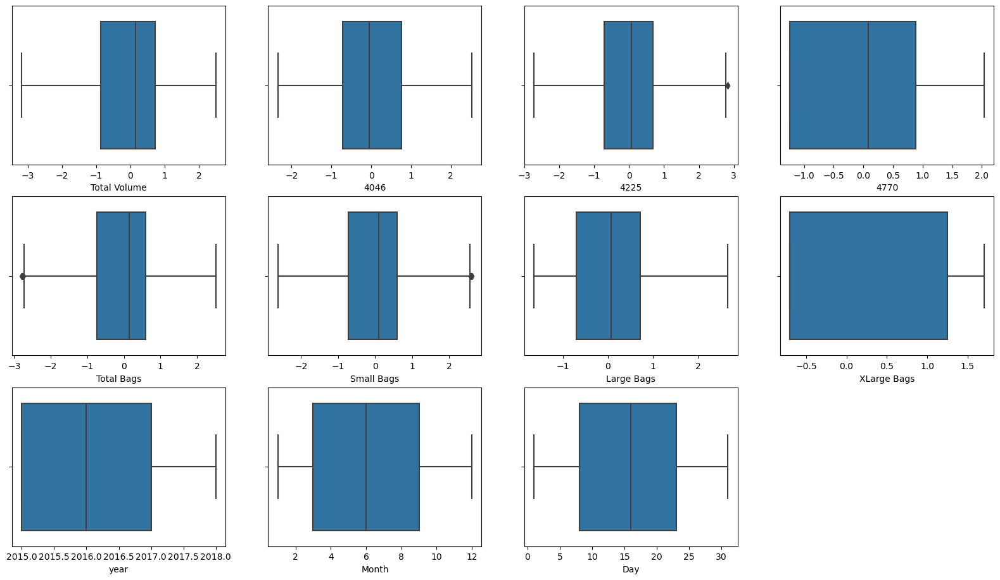

In [101]:
plt.figure(figsize=(20,15))
plotnumber=1


for column in x.columns:
    if plotnumber<=15:
        ax=plt.subplot(4,4,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column)
    plotnumber+=1   
plt.show()   

Here we can see that almost outliers removed from the data set.

In [102]:
#Dropping date column as it is not that useful for model building-

In [103]:
df.drop(columns=['Date'],inplace=True)

In [104]:
df

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,Albany,12,27
1,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,Albany,12,20
2,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,Albany,12,13
3,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,Albany,12,6
4,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,WestTexNewMexico,2,4
18245,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,WestTexNewMexico,1,28
18246,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,WestTexNewMexico,1,21
18247,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,WestTexNewMexico,1,14


# Multivariate analysis-

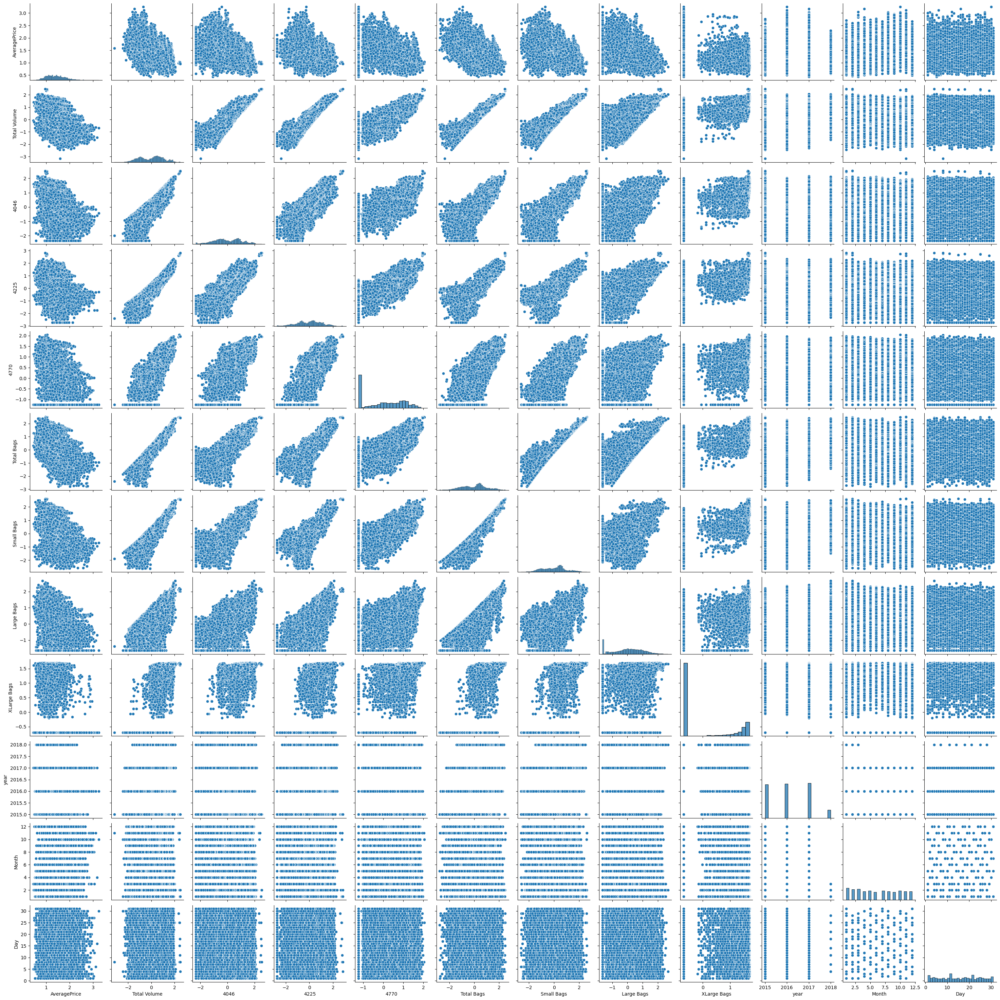

In [105]:
sns.pairplot(df)

# Observations-

Total volume & 4046 has positive correlationship with each other.       
Total volume & 4225 has positive correlationship with each other.        
Total volume & 4770 has positive correlationship with each other.        
Total volume & Total bags has positive correlationship with each other.           
Total volume & Small bags has positive correlationship with each other.        
Total volume & Large bags has positive correlationship with each other.        
4046 & 4225 has positive correlationship with each other.          
Small bags & 4046 has positive correlationship with each other.         
Small bags & 4225 has positive correlationship with each other.          
Small bags & 4770 has positive correlationship with each other.           
Small bags & Total bags has positive correlationship with each other.         
Total basg & large bags has positive correlationship with each other.            

# Encoding of the object data-

In [106]:
#Object data columns are-

In [107]:
object

['type', 'region']

In [108]:
df

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,Albany,12,27
1,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,Albany,12,20
2,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,Albany,12,13
3,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,Albany,12,6
4,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,WestTexNewMexico,2,4
18245,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,WestTexNewMexico,1,28
18246,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,WestTexNewMexico,1,21
18247,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,WestTexNewMexico,1,14


In [109]:
#Applying  Binary encoding method on region data as the categories are more in region column-

In [526]:
from category_encoders import BinaryEncoder

In [527]:
b=BinaryEncoder()

In [528]:
new_df=b.fit_transform(df['region'])

In [529]:
new_df

,region_0,region_1,region_2,region_3,region_4,region_5
0,0,0,0,0,0,1
1,0,0,0,0,0,1
2,0,0,0,0,0,1
3,0,0,0,0,0,1
4,0,0,0,0,0,1
...,...,...,...,...,...,...
18244,1,1,0,1,1,0
18245,1,1,0,1,1,0
18246,1,1,0,1,1,0
18247,1,1,0,1,1,0


In [530]:
#Concating original data frame with encoded data-

In [531]:
df = pd.concat([df, new_df], axis=1)
df.drop(columns="region",inplace=True)
df

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,Month,Day,region_0,region_1,region_2,region_3,region_4,region_5
0,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,12,27,0,0,0,0,0,1
1,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,12,20,0,0,0,0,0,1
2,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,12,13,0,0,0,0,0,1
3,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,12,6,0,0,0,0,0,1
4,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,11,29,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,2,4,1,1,0,1,1,0
18245,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,1,28,1,1,0,1,1,0
18246,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,1,21,1,1,0,1,1,0
18247,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,1,14,1,1,0,1,1,0


Here we can see that region column has been encoded & concated with main data frame properly.

In [532]:
#Applying label encoder on type column as categories are only two-

In [533]:
from sklearn.preprocessing import LabelEncoder

In [534]:
le= LabelEncoder()

In [535]:
df1=le.fit_transform(df['type'])
pd.Series(df1)

0        0
1        0
2        0
3        0
4        0
        ..
17898    1
17899    1
17900    1
17901    1
17902    1
Length: 17903, dtype: int32

In [536]:
df['type']=df1

In [537]:
df

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,Month,Day,region_0,region_1,region_2,region_3,region_4,region_5
0,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,0,2015,12,27,0,0,0,0,0,1
1,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,0,2015,12,20,0,0,0,0,0,1
2,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,0,2015,12,13,0,0,0,0,0,1
3,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,0,2015,12,6,0,0,0,0,0,1
4,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,0,2015,11,29,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,1,2018,2,4,1,1,0,1,1,0
18245,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,1,2018,1,28,1,1,0,1,1,0
18246,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,1,2018,1,21,1,1,0,1,1,0
18247,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,1,2018,1,14,1,1,0,1,1,0


Here we can see that type column also been encoded with the help of label encoder.

In [311]:
#Cheking data types after encoding-

In [312]:
df.dtypes

AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type              int32
year              int64
Month             int64
Day               int64
region_0          int64
region_1          int64
region_2          int64
region_3          int64
region_4          int64
region_5          int64
dtype: object

Here we can see all the object data has been encoded to numeric data.

In [313]:
#Checking data statistics again after encoding of data- 

In [314]:
df.describe()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,Month,Day,region_0,region_1,region_2,region_3,region_4,region_5
count,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000,17903.000000
mean,1.405087,-0.012031,-0.016006,-0.018961,-0.007152,-0.004883,0.003050,-0.016242,-0.007882,0.499190,2016.156957,6.177400,15.655309,0.416913,0.420935,0.449366,0.496900,0.506787,0.506005
std,0.401846,0.974471,0.978275,0.973337,0.986433,0.948636,0.927526,0.977464,0.994251,0.500013,0.939071,3.540993,8.774035,0.493062,0.493723,0.497443,0.500004,0.499968,0.499978
min,0.440000,-3.172920,-2.343573,-2.725056,-1.238310,-2.791311,-2.624488,-1.645675,-0.699849,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.100000,-0.878555,-0.714819,-0.708778,-1.238310,-0.734717,-0.723533,-0.710186,-0.699849,0.000000,2015.000000,3.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.370000,0.140553,-0.050278,0.071340,0.077857,0.144628,0.106229,0.073444,-0.699849,0.000000,2016.000000,6.000000,16.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
75%,1.660000,0.724861,0.758333,0.690923,0.889761,0.604362,0.594178,0.718529,1.247406,1.000000,2017.000000,9.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,3.250000,2.488765,2.527095,2.831567,2.036318,2.514190,2.611596,2.666846,1.703879,1.000000,2018.000000,12.000000,31.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Correlation matrix-

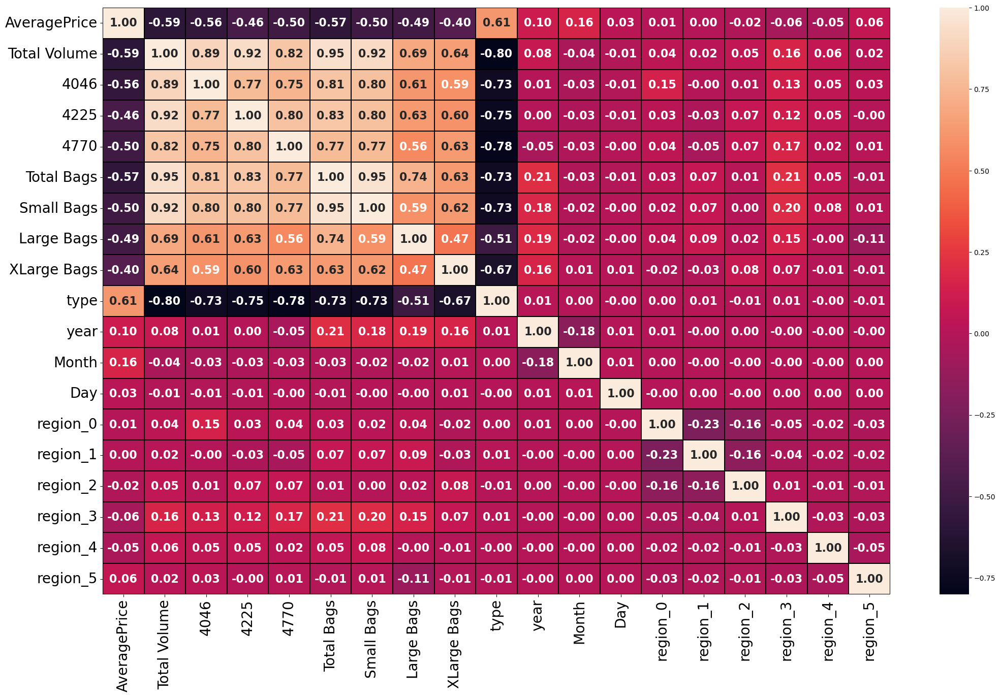

In [315]:
plt.figure(figsize=(25,15))
sns.heatmap(df.corr(),annot=True,fmt='.2f',linecolor='black',linewidth=0.2,annot_kws={'fontsize': 16,'fontweight': 'bold'})
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show() 

Observations-

1. There is 89% positive correlationship bw totalvolume & 4046.
2. There is 92% positive correlationship bw 4225 & Total Volume.
3. There is 82% positive correlationship bw totalvolume & 4770.
4. There is 95% positive correlationship bw totalvolume & totalbags.
5. There is 92% positive correlationship bw totalvolume & smallbags.
6. There is 83% positive correlationship bw 4225 & totalbags.
7. There is 80% negetive correlationship bw type & totalvolume.
8. There is 78% negetive correlationship bw type & 4770.
9. There is 73% negetive correlationship bw type & 4046.
10.There is 75% negetive correlationship bw 4225 & type.
11.There is 73% negetive correlationship bw totalbags & type.
12.There is 73% negetive correlationship bw smallbags & type.

# Correlation bw features & label-

In [316]:
df.corr()['AveragePrice'].sort_values(ascending=False).to_frame()

,AveragePrice
AveragePrice,1.000000
type,0.613085
Month,0.161107
year,0.104265
region_5,0.057573
Day,0.026702
region_0,0.006987
region_1,0.001029
region_2,-0.022941
region_4,-0.046755


# Graphical Representation of correlationship between features & target variable-¶

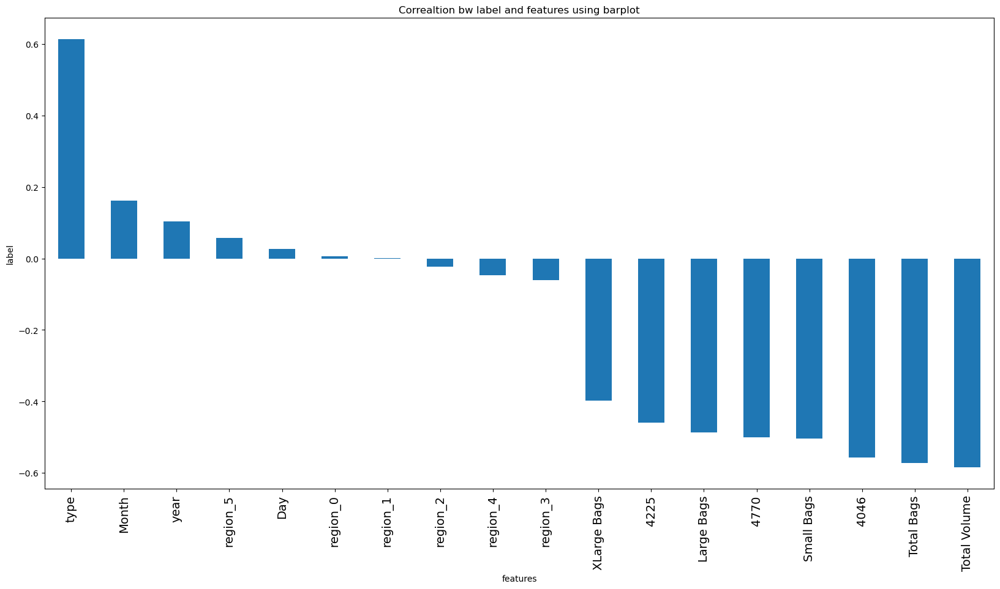

In [317]:
plt.figure(figsize=(20,10))
df.corr()['AveragePrice'].sort_values(ascending=False).drop(['AveragePrice']).plot(kind='bar')
plt.xlabel('features')
plt.ylabel('label')
plt.xticks(fontsize=14)
plt.title('Correaltion bw label and features using barplot')
plt.show()

Here we can see the correlationship bw features and our target varible.

1. Type of avacados has 61% correlationship with target variable which is maximum among all features.
2. Total volume,totalbags,4046,small bags,4770,large bags.4225 has high negetive correlationship with target variable averageprice.
3. Day,year & region column has very less correlationship with average price.

In [318]:
df

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,Month,Day,region_0,region_1,region_2,region_3,region_4,region_5
0,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,0,2015,12,27,0,0,0,0,0,1
1,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,0,2015,12,20,0,0,0,0,0,1
2,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,0,2015,12,13,0,0,0,0,0,1
3,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,0,2015,12,6,0,0,0,0,0,1
4,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,0,2015,11,29,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,1,2018,2,4,1,1,0,1,1,0
18245,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,1,2018,1,28,1,1,0,1,1,0
18246,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,1,2018,1,21,1,1,0,1,1,0
18247,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,1,2018,1,14,1,1,0,1,1,0


# Separating features and label-

In [319]:
x=df.drop('AveragePrice',axis=1)  
y=df['AveragePrice']

# Feature Scaling-

In [320]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,Month,Day,region_0,region_1,region_2,region_3,region_4,region_5
0,-0.076530,-0.656903,0.335221,-0.243408,-0.547244,-0.370542,-0.774585,-0.695988,-0.998381,-1.232057,1.644387,1.293021,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
1,-0.147484,-0.777783,0.257481,-0.196561,-0.507065,-0.333666,-0.764440,-0.695988,-0.998381,-1.232057,1.644387,0.495190,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
2,0.196376,-0.731861,0.614876,0.000080,-0.576775,-0.398225,-0.751534,-0.695988,-0.998381,-1.232057,1.644387,-0.302641,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
3,0.016324,-0.631941,0.445964,-0.143116,-0.727977,-0.538979,-0.691219,-0.695988,-0.998381,-1.232057,1.644387,-1.100472,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
4,-0.180215,-0.684170,0.250452,-0.132569,-0.700261,-0.517791,-0.598231,-0.695988,-0.998381,-1.232057,1.361972,1.520972,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17898,-0.679933,-0.461397,-0.925202,-1.248125,-0.347438,-0.196107,-0.403726,-0.695988,1.001621,1.962679,-1.179759,-1.328424,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082
17899,-0.775334,-0.617305,-0.664137,-1.248125,-0.518668,-0.354746,-0.475961,-0.695988,1.001621,1.962679,-1.462173,1.406996,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082
17900,-0.779393,-0.617252,-0.774198,0.414330,-0.512401,-0.336149,-0.948648,-0.695988,1.001621,1.962679,-1.462173,0.609166,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082
17901,-0.704039,-0.546157,-0.710546,0.414026,-0.442088,-0.271679,-0.912865,-0.695988,1.001621,1.962679,-1.462173,-0.188665,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082


Now the data has been scaled.

# Checking Multicollinearity among features-

In [321]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features']=x.columns
vif

,VIF Values,Features
0,56.318637,Total Volume
1,7.351694,4046
2,11.179311,4225
3,4.284176,4770
4,38.461072,Total Bags
5,18.163449,Small Bags
6,3.626093,Large Bags
7,2.143250,XLarge Bags
8,4.048659,type
9,1.420452,year


Here we can see that vif is higher than the acceptable range in total volume,total bags & small bags columns so we have to drop columns to reduce the multicollinearity among features.

In [322]:
x=x.drop(columns=['Total Volume','Total Bags',],axis=1)
x

,4046,4225,4770,Small Bags,Large Bags,XLarge Bags,type,year,Month,Day,region_0,region_1,region_2,region_3,region_4,region_5
0,-0.656903,0.335221,-0.243408,-0.370542,-0.774585,-0.695988,-0.998381,-1.232057,1.644387,1.293021,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
1,-0.777783,0.257481,-0.196561,-0.333666,-0.764440,-0.695988,-0.998381,-1.232057,1.644387,0.495190,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
2,-0.731861,0.614876,0.000080,-0.398225,-0.751534,-0.695988,-0.998381,-1.232057,1.644387,-0.302641,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
3,-0.631941,0.445964,-0.143116,-0.538979,-0.691219,-0.695988,-0.998381,-1.232057,1.644387,-1.100472,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
4,-0.684170,0.250452,-0.132569,-0.517791,-0.598231,-0.695988,-0.998381,-1.232057,1.361972,1.520972,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17898,-0.461397,-0.925202,-1.248125,-0.196107,-0.403726,-0.695988,1.001621,1.962679,-1.179759,-1.328424,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082
17899,-0.617305,-0.664137,-1.248125,-0.354746,-0.475961,-0.695988,1.001621,1.962679,-1.462173,1.406996,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082
17900,-0.617252,-0.774198,0.414330,-0.336149,-0.948648,-0.695988,1.001621,1.962679,-1.462173,0.609166,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082
17901,-0.546157,-0.710546,0.414026,-0.271679,-0.912865,-0.695988,1.001621,1.962679,-1.462173,-0.188665,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082


In [323]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features']=x.columns
vif

,VIF Values,Features
0,3.986629,4046
1,4.381353,4225
2,4.252796,4770
3,4.912465,Small Bags
4,2.041822,Large Bags
5,2.116690,XLarge Bags
6,3.745586,type
7,1.380431,year
8,1.052398,Month
9,1.000588,Day


Here we can see that the muticollinearity has been removed among features so now we can move further for model building-

In [324]:
#Correlation of features with target variable-

In [325]:
df.corr()['AveragePrice']

AveragePrice    1.000000
Total Volume   -0.585290
4046           -0.556858
4225           -0.459061
4770           -0.500294
Total Bags     -0.573275
Small Bags     -0.504535
Large Bags     -0.486166
XLarge Bags    -0.398176
type            0.613085
year            0.104265
Month           0.161107
Day             0.026702
region_0        0.006987
region_1        0.001029
region_2       -0.022941
region_3       -0.061047
region_4       -0.046755
region_5        0.057573
Name: AveragePrice, dtype: float64

# Model-I (With all features-)

In [326]:
#Importing libraries-

In [138]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge
from sklearn.model_selection import cross_val_score

In [139]:
maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i) 
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)   
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print('Best accuracy is', maxacc,'at random state',maxrs) 

Best accuracy is 0.5395200925651833 at random state 173


At random state-173 we got almost 54% accuracy so we will split data further on this random state only.

In [140]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=maxrs)

In [141]:
#Linear regression-

In [142]:
lr=LinearRegression()
lr.fit(x_train,y_train)
predlr=lr.predict(x_test)
pred_train=lr.predict(x_train)  
print('r2_score on test data -',r2_score(y_test,predlr))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predlr))
print('mean squared error- ',mean_squared_error(y_test,predlr))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predlr)))

r2_score on test data - 0.5395200925651833
r2_score on train data - 0.5136334603849761
mean absolute error-  0.21274570516321578
mean squared error-  0.07590181554461835
root mean squared error-  0.27550284126414804


for linear regression model train accuracy is 51% & test accuracy-54%.

In [143]:
#Cross validation score-

In [144]:
score=cross_val_score(lr,x,y)
print(score)
print(score.mean())
print('difference bw r2_score and cross validation score is ',(r2_score(y_test,predlr)-score.mean())*100)

[-0.44694562  0.19952797  0.46163335  0.17101182  0.17800275]
0.11264605602083792
difference bw r2_score and cross validation score is  42.68740365443453


The cross validation score is 11%.

In [145]:
#Random forest-

In [146]:
rf=RandomForestRegressor()
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
pred_train=rf.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predrf))
print('r2_score on train data -', r2_score(y_train,pred_train)) 
print('mean absolute error- ',mean_absolute_error(y_test,predrf))
print('mean squared error- ',mean_squared_error(y_test,predrf))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predrf)))

r2_score on test data - 0.8845063208943622
r2_score on train data - 0.9841096363261939
mean absolute error-  0.09508758145596724
mean squared error-  0.019037051967976167
root mean squared error-  0.1379748236743797


for Random forest model train accuracy is 98% & test accuracy-88%.

In [147]:
#Cross validation score-

In [148]:
score1=cross_val_score(rf,x,y)
print(score1)
print(score1.mean())
print('difference bw r2_score and cross validation score is ',(r2_score(y_test,predrf)-score1.mean())*100)

[-0.19748653  0.47131272  0.6168722   0.32074534 -0.00723687]
0.24084137084508073
difference bw r2_score and cross validation score is  64.36649500492815


The cross validation score is 24%.

In [149]:
#KNN-

In [150]:
kn=KNN()
kn.fit(x_train,y_train)
predkn=kn.predict(x_test)
pred_train=kn.predict(x_train)  
print('r2_score on test data -',r2_score(y_test,predkn))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predkn))
print('mean squared error- ',mean_squared_error(y_test,predkn))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predkn)))

r2_score on test data - 0.8009509798722425
r2_score on train data - 0.8690525126478779
mean absolute error-  0.13021336808787934
mean squared error-  0.0328096443865202
root mean squared error-  0.18113432691381331


for KNN model train accuracy is 86% & test accuracy-80%.

In [151]:
#Cross validation score-

In [152]:
score2=cross_val_score(kn,x,y)
print(score2)
print(score2.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predkn)-score2.mean())*100)

[-7.24722327e-01  2.30109894e-01  4.25718691e-01 -1.81351631e-01
 -1.66278158e-04]
-0.05008233011425693
difference bw r2_score and cross validation score is - 85.10333099864994


The cross validation score is -5%.

In [153]:
#Gradient boosting regressor-

In [154]:
gb=GradientBoostingRegressor()
gb.fit(x_train,y_train)
predgb=gb.predict(x_test)
pred_train=gb.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predgb))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predgb))
print('mean squared error- ',mean_squared_error(y_test,predgb))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predgb)))

r2_score on test data - 0.7308837477872819
r2_score on train data - 0.7393426691286764
mean absolute error-  0.15807101478917304
mean squared error-  0.04435896508340091
root mean squared error-  0.21061568100072917


for Gradient boosting regressor  model train accuracy is 74% & test accuracy-73%.

In [155]:
#Cross validation score-

In [156]:
score3=cross_val_score(gb,x,y)
print(score3)
print(score3.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predgb)-score3.mean())*100)

[0.05100599 0.55840343 0.64176232 0.31639367 0.16954505]
0.3474220942387704
difference bw r2_score and cross validation score is - 38.34616535485115


The cross validation score is 35%.

In [157]:
#lASSO-

In [158]:
lasso=Lasso()
lasso.fit(x_train,y_train)
predla=lasso.predict(x_test)
pred_train=lasso.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predla))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predla))
print('mean squared error- ',mean_squared_error(y_test,predla))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predla)))

r2_score on test data - -9.556184786307931e-05
r2_score on train data - 0.0
mean absolute error-  0.32744760343329304
mean squared error-  0.16484773306447312
root mean squared error-  0.40601444932966746


for Lasso model train accuracy is 0% & test accuracy-900%.here we can see lasso model is not working on this data set.

In [159]:
#Cross validation score-

In [160]:
score4=cross_val_score(lasso,x,y)
print(score4)
print(score4.mean())
print('difference bw r2_score and cross validation score is- ',(r2_score(y_test,predla)-score4.mean())*100)

[-3.92565437 -0.74976822 -0.01992998 -0.44689421 -0.82060643]
-1.192570642323561
difference bw r2_score and cross validation score is-  119.24750804756978


The cross validation score is 119%.

In [161]:
#Ridge-

In [162]:
rd=Ridge()
rd.fit(x_train,y_train)
predri=rd.predict(x_test)
pred_train=rd.predict(x_train)  
print('r2_score on test data -',r2_score(y_test,predri))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predri))
print('mean squared error- ',mean_squared_error(y_test,predri))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predri)))

r2_score on test data - 0.5395184889512773
r2_score on train data - 0.5136334400385303
mean absolute error-  0.2127444188614735
mean squared error-  0.0759020798714759
root mean squared error-  0.2755033209808475


for Ridge model train accuracy is 51% & test accuracy-54%.

In [163]:
#Cross validation score-

In [164]:
score5=cross_val_score(rd,x,y)
print(score5)
print(score5.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predri)-score5.mean())*100)

[-0.44678508  0.19957663  0.46165015  0.17099469  0.17798485]
0.11268424602946728
difference bw r2_score and cross validation score is - 42.683424292181


The cross validation score is 11%.

In [165]:
#Decision tree-

In [166]:
dt=DecisionTreeRegressor()
dt.fit(x_train,y_train)
preddt=dt.predict(x_test)
pred_train=dt.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,preddt))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,preddt))
print('mean squared error- ',mean_squared_error(y_test,preddt))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,preddt)))

r2_score on test data - 0.7559449545972269
r2_score on train data - 1.0
mean absolute error-  0.13034816607708063
mean squared error-  0.040228076708247996
root mean squared error-  0.2005693812830064


for Decision Tree model train accuracy is 100% & test accuracy-75%.

In [167]:
#Cross validation score-

In [168]:
score6=cross_val_score(dt,x,y)
print(score6)
print(score6.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,preddt)-score6.mean())*100)

[-0.81565574  0.19718733  0.28886435 -0.47042192 -0.37089305]
-0.23418380565744146
difference bw r2_score and cross validation score is - 99.01287602546684


The cross validation score is -22%.

In [169]:
#ExtraTreesRegressor

In [170]:
from sklearn.ensemble import ExtraTreesRegressor

In [171]:
et=ExtraTreesRegressor()
et.fit(x_train,y_train)
predet=et.predict(x_test)
pred_train=et.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predet))
print('r2_score on train data -', r2_score(y_train,pred_train)) 
print('mean absolute error- ',mean_absolute_error(y_test,predet))
print('mean squared error- ',mean_squared_error(y_test,predet))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predet)))

r2_score on test data - 0.9223476164803455
r2_score on train data - 1.0
mean absolute error-  0.0774746043567306
mean squared error-  0.012799596237199782
root mean squared error-  0.11313530057943799


for Extra Tree Regressor model train accuracy is 100% & test accuracy-92%.

In [172]:
#Cross validation score-

In [173]:
score8=cross_val_score(et,x,y)
print(score8)
print(score8.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predet)-score8.mean())*100)

[-0.09518618  0.56113029  0.66605335  0.3102801   0.14102976]
0.31666146288389563
difference bw r2_score and cross validation score is - 60.56861535964499


The cross validation score is 32%.

Here i am selecting gradient boosting regressor as my best model as it is giving train accuracy-74% and test accuracy-73% with cross validation score of 34%, which only looks generalised model.the accuracy are less but we will try to increase the accuracy by hypertunning the parameters of the model.

# Hyperparameter Tunning-

In [174]:
from sklearn.model_selection import RandomizedSearchCV

Here i have used grid search cv but it was taking a lot of time i have waited for more than 9 hrs still it wasnt completed so i went to use randomised search cv.

In [175]:
param_grid={'loss':['squared_error', 'absolute_error'],'criterion' : ['friedman_mse', 'squared_error'],'random_state':[10,20,40],'max_depth':[7,9],
            'n_estimators':[100,200,400],'min_samples_leaf':[2,3]}

In [176]:
rs=RandomizedSearchCV(GradientBoostingRegressor(),param_grid,cv=5)

In [177]:
rs.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=GradientBoostingRegressor(),
                   param_distributions={'criterion': ['friedman_mse',
                                                      'squared_error'],
                                        'loss': ['squared_error',
                                                 'absolute_error'],
                                        'max_depth': [7, 9],
                                        'min_samples_leaf': [2, 3],
                                        'n_estimators': [100, 200, 400],
                                        'random_state': [10, 20, 40]})

In [178]:
rs.best_params_

{'random_state': 20,
 'n_estimators': 400,
 'min_samples_leaf': 3,
 'max_depth': 7,
 'loss': 'squared_error',
 'criterion': 'squared_error'}

In [181]:
final_model=GradientBoostingRegressor(criterion='friedman_mse',max_depth=7,loss='squared_error',n_estimators=400,random_state=20,min_samples_leaf= 3)
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)

In [182]:
r2_score(y_test,pred)

0.9033505026778129

The accuracy of the model is increased to 90% by hyperparameter tunning.

# Saving model-I

In [183]:
import joblib
joblib.dump(final_model,'AveragePricePrediction-1')

['AveragePricePrediction-1']

In [184]:
model=joblib.load('AveragePricePrediction-1')

In [185]:
prediction=model.predict(x_test)
prediction

array([1.20886549, 1.36709576, 1.17915377, ..., 2.39405393, 1.6958327 ,
       1.13729523])

In [186]:
a=np.array(y_test)
df=pd.DataFrame()
df['predicted']=prediction
df['original']=a
df

,predicted,original
0,1.208865,1.08
1,1.367096,1.37
2,1.179154,1.17
3,1.181408,1.16
4,1.170424,1.27
...,...,...
5366,1.561307,1.63
5367,1.342027,1.39
5368,2.394054,2.37
5369,1.695833,1.70


# Model-II (Feature selection with Select KBest method)-

Imported the data frame with removed skewness and outliers with encoded object data.

In [327]:
df

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,Month,Day,region_0,region_1,region_2,region_3,region_4,region_5
0,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,0,2015,12,27,0,0,0,0,0,1
1,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,0,2015,12,20,0,0,0,0,0,1
2,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,0,2015,12,13,0,0,0,0,0,1
3,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,0,2015,12,6,0,0,0,0,0,1
4,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,0,2015,11,29,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,1,2018,2,4,1,1,0,1,1,0
18245,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,1,2018,1,28,1,1,0,1,1,0
18246,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,1,2018,1,21,1,1,0,1,1,0
18247,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,1,2018,1,14,1,1,0,1,1,0


# Correlationship of features with label-

In [328]:
df.corr()['AveragePrice']

AveragePrice    1.000000
Total Volume   -0.585290
4046           -0.556858
4225           -0.459061
4770           -0.500294
Total Bags     -0.573275
Small Bags     -0.504535
Large Bags     -0.486166
XLarge Bags    -0.398176
type            0.613085
year            0.104265
Month           0.161107
Day             0.026702
region_0        0.006987
region_1        0.001029
region_2       -0.022941
region_3       -0.061047
region_4       -0.046755
region_5        0.057573
Name: AveragePrice, dtype: float64

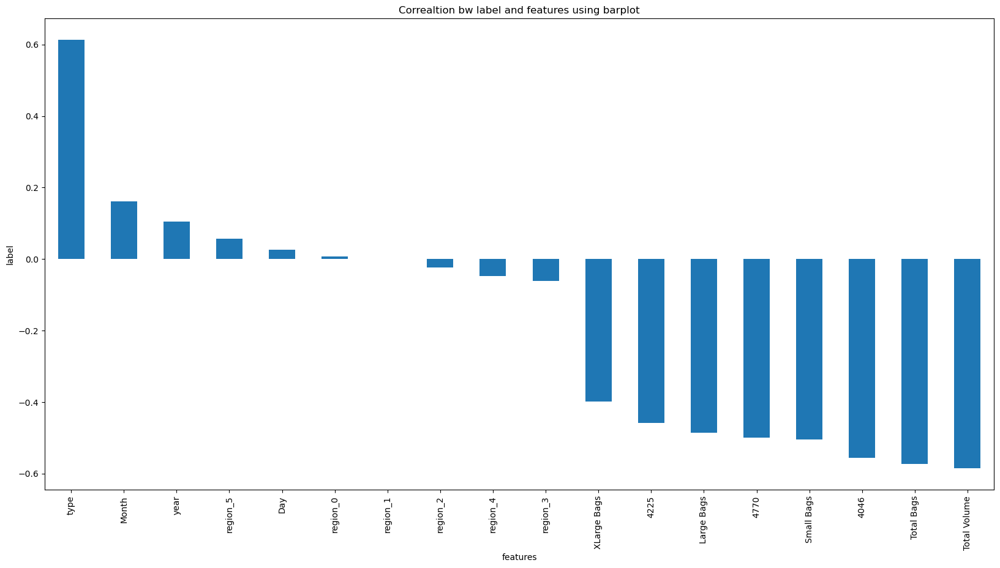

In [329]:
plt.figure(figsize=(20,10))
df.corr()['AveragePrice'].sort_values(ascending=False).drop(['AveragePrice']).plot(kind='bar')
plt.xlabel('features')
plt.ylabel('label')
plt.title('Correaltion bw label and features using barplot')
plt.show()

# Feature selection through select k-best method-

In [330]:
x=df.drop(columns=['AveragePrice'],axis=1)
y=df.AveragePrice

In [331]:
from sklearn.feature_selection import SelectKBest,f_classif

In [332]:
best_features=SelectKBest(score_func=f_classif,k=17) 

fit=best_features.fit(x,y)
df_scores=pd.DataFrame(fit.scores_)   
df_columns=pd.DataFrame(x.columns) 



feature_score= pd.concat([df_scores,df_columns],axis=1)
feature_score.columns=['score','feature_name']  

print(feature_score.nlargest(14,'score'))

        score  feature_name
8   51.289280          type
0   41.864958  Total Volume
1   38.038756          4046
4   37.772794    Total Bags
3   29.135797          4770
5   26.612606    Small Bags
6   24.614051    Large Bags
2   23.193914          4225
7   16.051000   XLarge Bags
9    3.192963          year
10   2.983178         Month
15   1.997420      region_3
16   1.952482      region_4
17   1.851181      region_5


Here we can see that after XLarge bags the score is not changing much so i will take features from type to XLarge Bags.

In [333]:
#lets just saperate these 9 features in a new variable.

In [334]:
new_df=df[['type','Total Volume','4046','Total Bags','4770','Small Bags','Large Bags','4225','XLarge Bags','AveragePrice']]
new_df

,type,Total Volume,4046,Total Bags,4770,Small Bags,Large Bags,4225,XLarge Bags,AveragePrice
0,0,-0.086605,-0.658619,-0.524004,-0.247250,-0.340627,-0.773351,0.307313,-0.699849,1.33
1,0,-0.155746,-0.776870,-0.485890,-0.201041,-0.306425,-0.763435,0.231647,-0.699849,1.35
2,0,0.179327,-0.731947,-0.552018,-0.007072,-0.366303,-0.750820,0.579503,-0.699849,0.93
3,0,0.003876,-0.634200,-0.695449,-0.148322,-0.496853,-0.691865,0.415100,-0.699849,1.08
4,0,-0.187640,-0.685293,-0.669157,-0.137918,-0.477201,-0.600975,0.224806,-0.699849,1.28
...,...,...,...,...,...,...,...,...,...,...
18244,1,-0.674587,-0.467366,-0.334466,-1.238310,-0.178839,-0.410859,-0.919470,-0.699849,1.63
18245,1,-0.767550,-0.619883,-0.496897,-1.238310,-0.325977,-0.481465,-0.665372,-0.699849,1.71
18246,1,-0.771505,-0.619831,-0.490952,0.401546,-0.308728,-0.943486,-0.772496,-0.699849,1.87
18247,1,-0.698077,-0.550282,-0.424252,0.401246,-0.248932,-0.908510,-0.710543,-0.699849,1.93


In [335]:
#Separating features and label from the new data frame-

In [336]:
x=new_df.drop(columns=['AveragePrice'],axis=1)
y=new_df.AveragePrice

In [337]:
x

,type,Total Volume,4046,Total Bags,4770,Small Bags,Large Bags,4225,XLarge Bags
0,0,-0.086605,-0.658619,-0.524004,-0.247250,-0.340627,-0.773351,0.307313,-0.699849
1,0,-0.155746,-0.776870,-0.485890,-0.201041,-0.306425,-0.763435,0.231647,-0.699849
2,0,0.179327,-0.731947,-0.552018,-0.007072,-0.366303,-0.750820,0.579503,-0.699849
3,0,0.003876,-0.634200,-0.695449,-0.148322,-0.496853,-0.691865,0.415100,-0.699849
4,0,-0.187640,-0.685293,-0.669157,-0.137918,-0.477201,-0.600975,0.224806,-0.699849
...,...,...,...,...,...,...,...,...,...
18244,1,-0.674587,-0.467366,-0.334466,-1.238310,-0.178839,-0.410859,-0.919470,-0.699849
18245,1,-0.767550,-0.619883,-0.496897,-1.238310,-0.325977,-0.481465,-0.665372,-0.699849
18246,1,-0.771505,-0.619831,-0.490952,0.401546,-0.308728,-0.943486,-0.772496,-0.699849
18247,1,-0.698077,-0.550282,-0.424252,0.401246,-0.248932,-0.908510,-0.710543,-0.699849


# Feature scaling-

In [338]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,type,Total Volume,4046,Total Bags,4770,Small Bags,Large Bags,4225,XLarge Bags
0,-0.998381,-0.076530,-0.656903,-0.547244,-0.243408,-0.370542,-0.774585,0.335221,-0.695988
1,-0.998381,-0.147484,-0.777783,-0.507065,-0.196561,-0.333666,-0.764440,0.257481,-0.695988
2,-0.998381,0.196376,-0.731861,-0.576775,0.000080,-0.398225,-0.751534,0.614876,-0.695988
3,-0.998381,0.016324,-0.631941,-0.727977,-0.143116,-0.538979,-0.691219,0.445964,-0.695988
4,-0.998381,-0.180215,-0.684170,-0.700261,-0.132569,-0.517791,-0.598231,0.250452,-0.695988
...,...,...,...,...,...,...,...,...,...
17898,1.001621,-0.679933,-0.461397,-0.347438,-1.248125,-0.196107,-0.403726,-0.925202,-0.695988
17899,1.001621,-0.775334,-0.617305,-0.518668,-1.248125,-0.354746,-0.475961,-0.664137,-0.695988
17900,1.001621,-0.779393,-0.617252,-0.512401,0.414330,-0.336149,-0.948648,-0.774198,-0.695988
17901,1.001621,-0.704039,-0.546157,-0.442088,0.414026,-0.271679,-0.912865,-0.710546,-0.695988


# Checking for multicollinearity-

In [339]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features']=x.columns
vif

,VIF Values,Features
0,3.662106,type
1,53.323166,Total Volume
2,6.715095,4046
3,36.393828,Total Bags
4,3.928139,4770
5,17.762337,Small Bags
6,3.491927,Large Bags
7,10.959934,4225
8,2.024172,XLarge Bags


In [340]:
x=x.drop(columns=['Total Volume','Small Bags'],axis=1)
x

,type,4046,Total Bags,4770,Large Bags,4225,XLarge Bags
0,-0.998381,-0.656903,-0.547244,-0.243408,-0.774585,0.335221,-0.695988
1,-0.998381,-0.777783,-0.507065,-0.196561,-0.764440,0.257481,-0.695988
2,-0.998381,-0.731861,-0.576775,0.000080,-0.751534,0.614876,-0.695988
3,-0.998381,-0.631941,-0.727977,-0.143116,-0.691219,0.445964,-0.695988
4,-0.998381,-0.684170,-0.700261,-0.132569,-0.598231,0.250452,-0.695988
...,...,...,...,...,...,...,...
17898,1.001621,-0.461397,-0.347438,-1.248125,-0.403726,-0.925202,-0.695988
17899,1.001621,-0.617305,-0.518668,-1.248125,-0.475961,-0.664137,-0.695988
17900,1.001621,-0.617252,-0.512401,0.414330,-0.948648,-0.774198,-0.695988
17901,1.001621,-0.546157,-0.442088,0.414026,-0.912865,-0.710546,-0.695988


In [341]:
# Checking VIF again after dropping the correlated columns-

In [342]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features']=x.columns
vif

,VIF Values,Features
0,3.392098,type
1,3.520557,4046
2,5.445232,Total Bags
3,3.859578,4770
4,2.223869,Large Bags
5,4.288025,4225
6,1.993586,XLarge Bags


Now we can see that VIF score is under acceptable limit.

In [343]:
x

,type,4046,Total Bags,4770,Large Bags,4225,XLarge Bags
0,-0.998381,-0.656903,-0.547244,-0.243408,-0.774585,0.335221,-0.695988
1,-0.998381,-0.777783,-0.507065,-0.196561,-0.764440,0.257481,-0.695988
2,-0.998381,-0.731861,-0.576775,0.000080,-0.751534,0.614876,-0.695988
3,-0.998381,-0.631941,-0.727977,-0.143116,-0.691219,0.445964,-0.695988
4,-0.998381,-0.684170,-0.700261,-0.132569,-0.598231,0.250452,-0.695988
...,...,...,...,...,...,...,...
17898,1.001621,-0.461397,-0.347438,-1.248125,-0.403726,-0.925202,-0.695988
17899,1.001621,-0.617305,-0.518668,-1.248125,-0.475961,-0.664137,-0.695988
17900,1.001621,-0.617252,-0.512401,0.414330,-0.948648,-0.774198,-0.695988
17901,1.001621,-0.546157,-0.442088,0.414026,-0.912865,-0.710546,-0.695988


In [344]:
y

0        1.33
1        1.35
2        0.93
3        1.08
4        1.28
         ... 
18244    1.63
18245    1.71
18246    1.87
18247    1.93
18248    1.62
Name: AveragePrice, Length: 17903, dtype: float64

# Model building-

In [768]:
#Importing library-

In [345]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge

In [346]:
maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i) 
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)   
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print('Best accuracy is', maxacc,'at random state',maxrs) 

Best accuracy is 0.48008016159242983 at random state 173


We are getting 48% accuracy on random forest-173 so we will split data on this random state only.

In [347]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=maxrs)

We have splitted the data on the same random state for further model building.

In [348]:
#Linear regression-

In [349]:
lr=LinearRegression()
lr.fit(x_train,y_train)
predlr=lr.predict(x_test)
pred_train=lr.predict(x_train)  
print('r2_score on test data -',r2_score(y_test,predlr))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predlr))
print('mean squared error- ',mean_squared_error(y_test,predlr))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predlr)))

r2_score on test data - 0.48008016159242983
r2_score on train data - 0.45118496932884666
mean absolute error-  0.2238652409662141
mean squared error-  0.08569941714207224
root mean squared error-  0.29274462786201944


For linear regression model we are getting train accuracy-45% & test accuracy-48%.

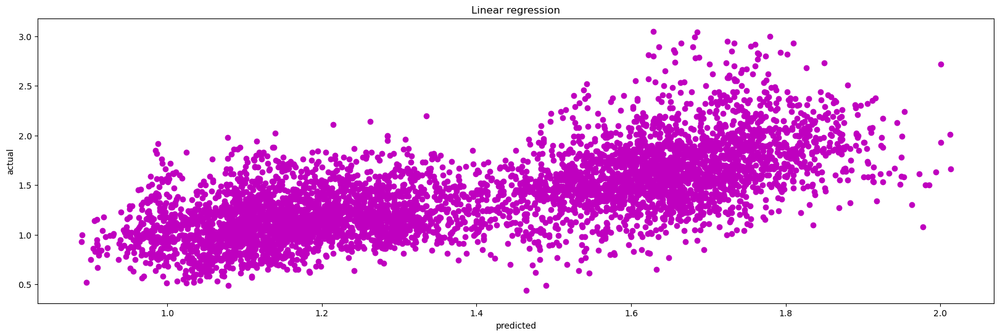

In [350]:
plt.figure(figsize=(20,6))
plt.scatter(x=predlr,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

here in above plot we can see that the actual & predicted data points are very much far.

In [351]:
#Cross validation score-

In [352]:
score=cross_val_score(lr,x,y)
print(score)
print(score.mean())
print('difference bw r2_score and cross validation score is ',(r2_score(y_test,predlr)-score.mean())*100)

[-0.93165417  0.03078785  0.43070911  0.0638436   0.03706709]
-0.07384930323344999
difference bw r2_score and cross validation score is  55.39294648258798


The cross validation score for linear regression is 7%.

In [353]:
#Random forest-

In [354]:
rf=RandomForestRegressor()
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
pred_train=rf.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predrf))
print('r2_score on train data -', r2_score(y_train,pred_train)) 
print('mean absolute error- ',mean_absolute_error(y_test,predrf))
print('mean squared error- ',mean_squared_error(y_test,predrf))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predrf)))

r2_score on test data - 0.7732752810740682
r2_score on train data - 0.9652029902953316
mean absolute error-  0.1355410351889778
mean squared error-  0.03737148465648854
root mean squared error-  0.19331705733454702


For Random forest model we are getting train accuracy-96% & test accuracy-77% which looks like am overfitted model.

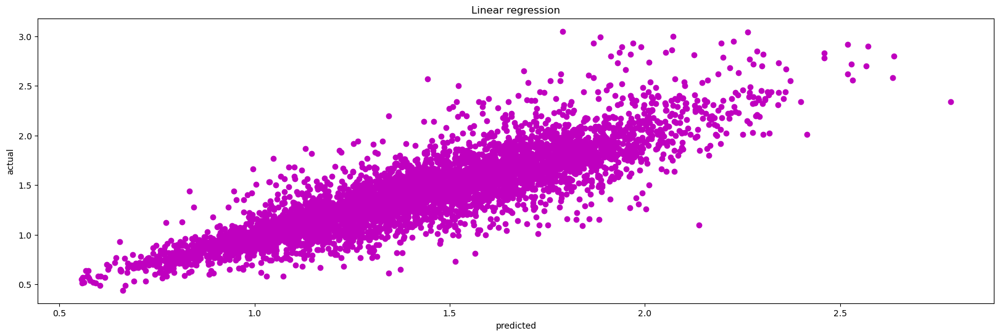

In [355]:
plt.figure(figsize=(20,6))
plt.scatter(x=predrf,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

here in above plot we can see that the actual & predicted data points are much far.

In [356]:
#Cross validation score-

In [357]:
score1=cross_val_score(rf,x,y)
print(score1)
print(score1.mean())
print('difference bw r2_score and cross validation score is ',(r2_score(y_test,predrf)-score1.mean())*100)

[-0.36127804  0.28381055  0.51158176  0.22742273 -0.05149516]
0.12200836583230903
difference bw r2_score and cross validation score is  65.12669152417591


The cross validation score is 12%.

In [358]:
#KNN-

In [389]:
kn=KNN()
kn.fit(x_train,y_train)
predkn=kn.predict(x_test)
pred_train=kn.predict(x_train)  
print('r2_score on test data -',r2_score(y_test,predkn))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predkn))
print('mean squared error- ',mean_squared_error(y_test,predkn))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predkn)))

r2_score on test data - 0.7644511796714092
r2_score on train data - 0.8314877879243319
mean absolute error-  0.13823310370508285
mean squared error-  0.03882597877490225
root mean squared error-  0.19704308862505746


For KNN model we are getting train accuracy-83% & test accuracy-76%.

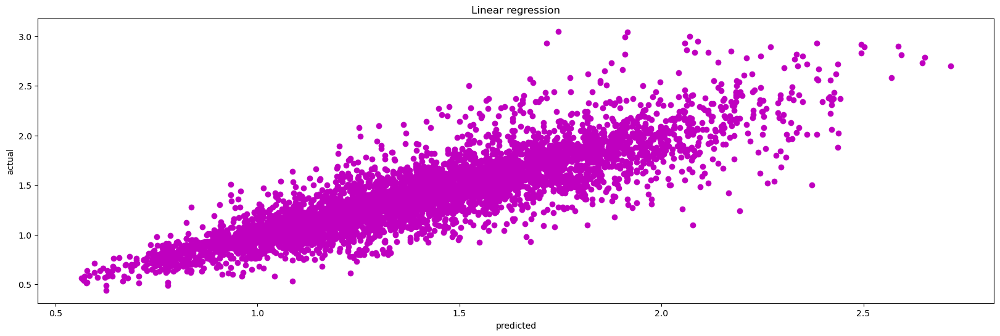

In [360]:
plt.figure(figsize=(20,6))
plt.scatter(x=predkn,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

here in above plot we can see that the actual & predicted data points are much far.

In [361]:
#Cross validation score-

In [362]:
score2=cross_val_score(kn,x,y)
print(score2)
print(score2.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predkn)-score2.mean())*100)

[-0.72049811  0.24544319  0.40357317  0.04386897 -0.15803029]
-0.03712861370680236
difference bw r2_score and cross validation score is - 80.15797933782115


The cross validation score is 3%.

In [363]:
#Gradient boosting regressor-

In [364]:
gb=GradientBoostingRegressor()
gb.fit(x_train,y_train)
predgb=gb.predict(x_test)
pred_train=gb.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predgb))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predgb))
print('mean squared error- ',mean_squared_error(y_test,predgb))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predgb)))

r2_score on test data - 0.6129450802228904
r2_score on train data - 0.6155368127577662
mean absolute error-  0.18921184850457154
mean squared error-  0.06379902934357207
root mean squared error-  0.2525846973661945


For KNN model we are getting train accuracy-61% & test accuracy-61%.

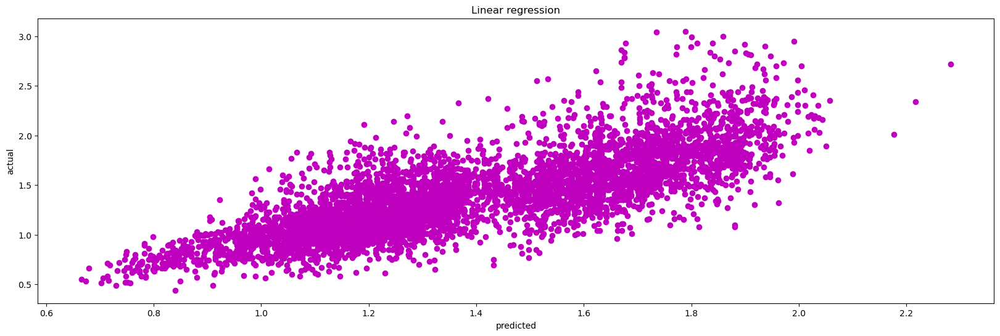

In [365]:
plt.figure(figsize=(20,6))
plt.scatter(x=predgb,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

here in above plot we can see that the actual & predicted data points are much far.

In [366]:
#Cross validation score-

In [367]:
score3=cross_val_score(gb,x,y)
print(score3)
print(score3.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predgb)-score3.mean())*100)

[-0.27689264  0.19979751  0.51957992  0.23658954  0.00558241]
0.1369313458729162
difference bw r2_score and cross validation score is - 47.60137343499742


The cross validation score is 13%.

In [368]:
#Lasso-

In [369]:
lasso=Lasso()
lasso.fit(x_train,y_train)
predla=lasso.predict(x_test)
pred_train=lasso.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predla))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predla))
print('mean squared error- ',mean_squared_error(y_test,predla))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predla)))

r2_score on test data - -9.556184786307931e-05
r2_score on train data - 0.0
mean absolute error-  0.32744760343329304
mean squared error-  0.16484773306447312
root mean squared error-  0.40601444932966746


For Lasso model we are getting train accuracy-0% & test accuracy-900% which looks like model is not performing good on this data set.

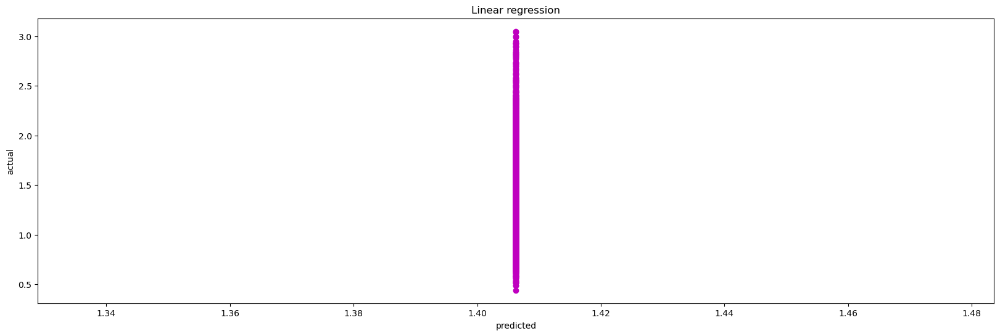

In [370]:
plt.figure(figsize=(20,6))
plt.scatter(x=predla,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

In [371]:
#Cross validation score-

In [372]:
score4=cross_val_score(lasso,x,y)
print(score4)
print(score4.mean())
print('difference bw r2_score and cross validation score is- ',(r2_score(y_test,predla)-score4.mean())*100)

[-3.92565437 -0.74976822 -0.01992998 -0.44689421 -0.82060643]
-1.192570642323561
difference bw r2_score and cross validation score is-  119.24750804756978


The cross validation score is -119% which is not good.

In [373]:
#Ridge-

In [374]:
rd=Ridge()
rd.fit(x_train,y_train)
predri=rd.predict(x_test)
pred_train=rd.predict(x_train)  
print('r2_score on test data -',r2_score(y_test,predri))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predri))
print('mean squared error- ',mean_squared_error(y_test,predri))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predri)))

r2_score on test data - 0.48007559105132
r2_score on train data - 0.45118495566816663
mean absolute error-  0.22386574295531697
mean squared error-  0.08570017051341951
root mean squared error-  0.2927459145973168


For Ridge model we are getting train accuracy-45% & test accuracy-48% which looks like an underfitted model.

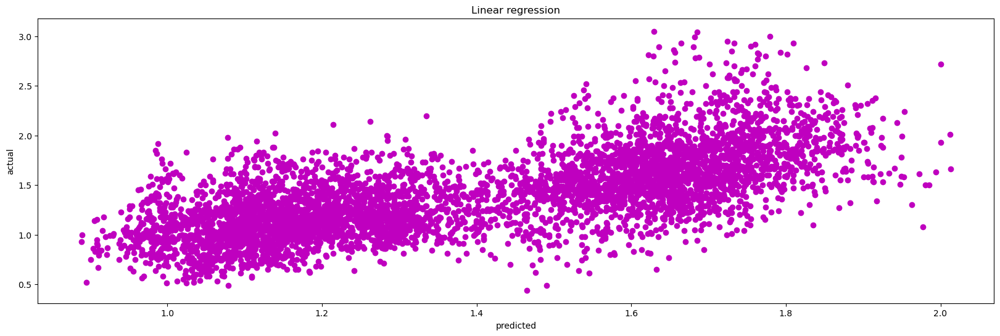

In [375]:
plt.figure(figsize=(20,6))
plt.scatter(x=predri,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

here in above plot we can see that the actual & predicted data points are very much far.

In [376]:
#Cross validation score-

In [377]:
score5=cross_val_score(rd,x,y)
print(score5)
print(score5.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predri)-score5.mean())*100)

[-0.93165684  0.03087137  0.43077628  0.06385518  0.03702776]
-0.07382524824670693
difference bw r2_score and cross validation score is - 55.39008392980269


The cross validation score is 7%.

In [378]:
#Decision tree-

In [379]:
dt=DecisionTreeRegressor()
dt.fit(x_train,y_train)
preddt=dt.predict(x_test)
pred_train=dt.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,preddt))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,preddt))
print('mean squared error- ',mean_squared_error(y_test,preddt))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,preddt)))

r2_score on test data - 0.5497714451103717
r2_score on train data - 1.0
mean absolute error-  0.1802345931856265
mean squared error-  0.07421206479240364
root mean squared error-  0.2724189141605326


For Decision Tree model we are getting train accuracy-100% & test accuracy-55% which looks like an overfitted model.

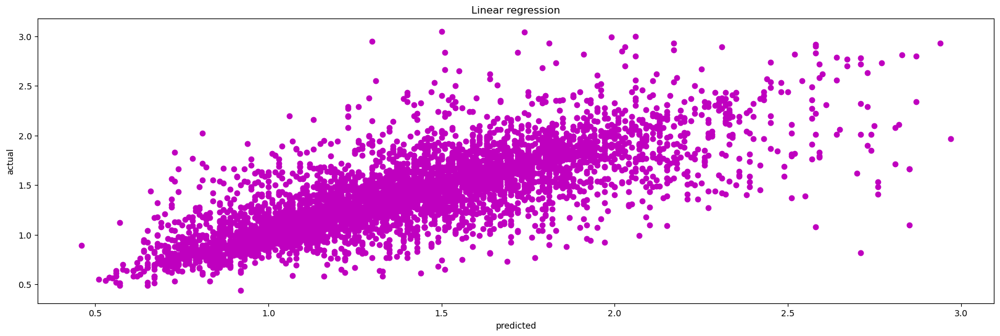

In [380]:
plt.figure(figsize=(20,6))
plt.scatter(x=preddt,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

here in above plot we can see that the actual & predicted data points are much far.

In [381]:
#Cross validation score-

In [382]:
score6=cross_val_score(dt,x,y)
print(score6)
print(score6.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,preddt)-score6.mean())*100)

[-1.80619189 -0.10829342  0.11990976 -0.42933723 -0.40295872]
-0.5253743012617803
difference bw r2_score and cross validation score is - 107.5145746372152


The cross validation score is 52%

In [383]:
#ExtraTreesRegressor

In [384]:
from sklearn.ensemble import ExtraTreesRegressor

In [385]:
et=ExtraTreesRegressor()
et.fit(x_train,y_train)
predet=et.predict(x_test)
pred_train=et.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predet))
print('r2_score on train data -', r2_score(y_train,pred_train)) 
print('mean absolute error- ',mean_absolute_error(y_test,predet))
print('mean squared error- ',mean_squared_error(y_test,predet))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predet)))

r2_score on test data - 0.7910694397079374
r2_score on train data - 1.0
mean absolute error-  0.12876600260659093
mean squared error-  0.034438438231241854
root mean squared error-  0.185575963506166


For Extra tree regressor model we are getting train accuracy-100% & test accuracy-79% which looks like an overfitted model.

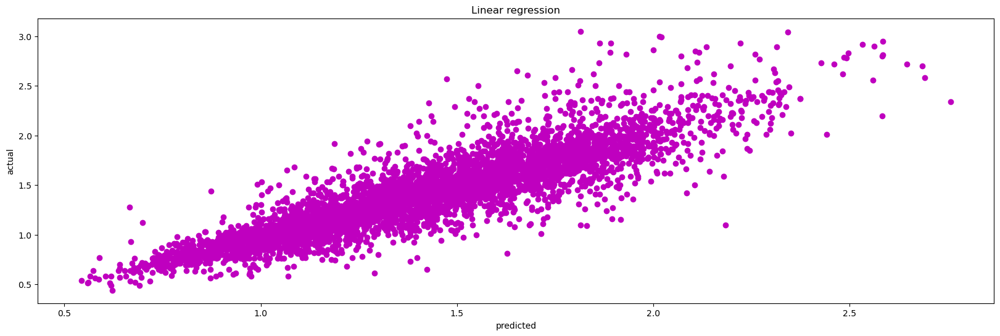

In [386]:
plt.figure(figsize=(20,6))
plt.scatter(x=predet,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

here in above plot we can see that the actual & predicted data points are much far.

In [387]:
#Cross validation score-

In [388]:
score8=cross_val_score(et,x,y)
print(score8)
print(score8.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predet)-score8.mean())*100)

[-0.26931361  0.32789015  0.53033489  0.23024296 -0.02074854]
0.15968116910993496
difference bw r2_score and cross validation score is - 63.13882705980025


The cross validation score is 16%.

here we can see that gradient boosting regressor is the best model which is giving 61% train accuracy & 61% test accuracy with 13% cross validation score. so i will perform hyperparameter tunning on this model.

# Hyperparameter Tunning-

In [390]:
from sklearn.model_selection import RandomizedSearchCV

In [408]:
param_grid={'loss':['squared_error', 'absolute_error'],'criterion' : ['friedman_mse', 'squared_error'],'random_state':[10,20,40],'max_depth':[7,9],
            'n_estimators':[100,200,400],'min_samples_leaf':[2,3]}

In [409]:
rs=RandomizedSearchCV(GradientBoostingRegressor(),param_grid,cv=5)

In [410]:
rs.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=GradientBoostingRegressor(),
                   param_distributions={'criterion': ['friedman_mse',
                                                      'squared_error'],
                                        'loss': ['squared_error',
                                                 'absolute_error'],
                                        'max_depth': [7, 9],
                                        'min_samples_leaf': [2, 3],
                                        'n_estimators': [100, 200, 400],
                                        'random_state': [10, 20, 40]})

In [411]:
rs.best_params_

{'random_state': 40,
 'n_estimators': 400,
 'min_samples_leaf': 2,
 'max_depth': 9,
 'loss': 'squared_error',
 'criterion': 'squared_error'}

In [412]:
final_model=GradientBoostingRegressor(criterion='squared_error',max_depth=9,loss='squared_error',n_estimators=400,random_state=40,min_samples_leaf=2)
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)

In [413]:
r2_score(y_test,pred)

0.7542310704352866

The accuracy increased to 75% with the help of randomised search CV.

# Saving model-

In [414]:
import joblib
joblib.dump(final_model,'Average Price-2')

['Average Price-2']

In [415]:
model=joblib.load('Average Price-2')

In [416]:
prediction=model.predict(x_test)
prediction

array([1.06301438, 1.31115828, 1.19010341, ..., 2.18802549, 1.69136629,
       1.38488435])

In [417]:
a=np.array(y_test)
df=pd.DataFrame()
df['predicted']=prediction
df['original']=a
df

,predicted,original
0,1.063014,1.08
1,1.311158,1.37
2,1.190103,1.17
3,1.140312,1.16
4,1.244439,1.27
...,...,...
5366,1.705846,1.63
5367,1.429153,1.39
5368,2.188025,2.37
5369,1.691366,1.70


# Model-III (Using Principle component analysis-)

In [356]:
#Importing the data frame from the above after removal of outliers & skewness with encoding of object data.

In [538]:
df

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,Month,Day,region_0,region_1,region_2,region_3,region_4,region_5
0,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,0,2015,12,27,0,0,0,0,0,1
1,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,0,2015,12,20,0,0,0,0,0,1
2,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,0,2015,12,13,0,0,0,0,0,1
3,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,0,2015,12,6,0,0,0,0,0,1
4,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,0,2015,11,29,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,1,2018,2,4,1,1,0,1,1,0
18245,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,1,2018,1,28,1,1,0,1,1,0
18246,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,1,2018,1,21,1,1,0,1,1,0
18247,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,1,2018,1,14,1,1,0,1,1,0


In [539]:
df.dtypes

AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type              int32
year              int64
Month             int64
Day               int64
region_0          int64
region_1          int64
region_2          int64
region_3          int64
region_4          int64
region_5          int64
dtype: object

# Relationship bw features and label-

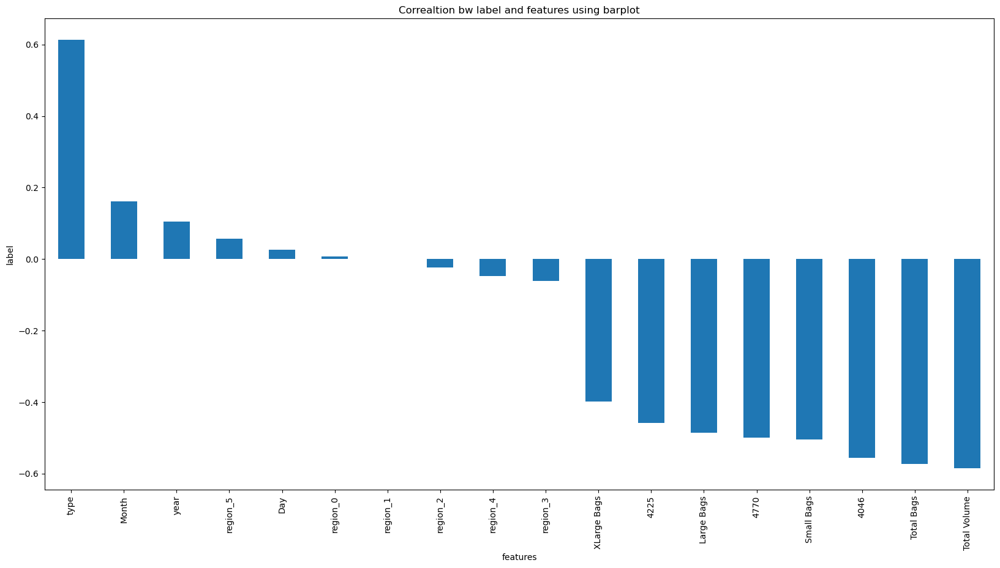

In [541]:
plt.figure(figsize=(20,10))
df.corr()['AveragePrice'].sort_values(ascending=False).drop(['AveragePrice']).plot(kind='bar')
plt.xlabel('features')
plt.ylabel('label')
plt.title('Correaltion bw label and features using barplot')
plt.show()

# Separating features and label-

In [543]:
x=df.drop(columns=['AveragePrice'],axis=1)
y=df.AveragePrice

# Feature scaling-

In [544]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,Month,Day,region_0,region_1,region_2,region_3,region_4,region_5
0,-0.076530,-0.656903,0.335221,-0.243408,-0.547244,-0.370542,-0.774585,-0.695988,-0.998381,-1.232057,1.644387,1.293021,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
1,-0.147484,-0.777783,0.257481,-0.196561,-0.507065,-0.333666,-0.764440,-0.695988,-0.998381,-1.232057,1.644387,0.495190,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
2,0.196376,-0.731861,0.614876,0.000080,-0.576775,-0.398225,-0.751534,-0.695988,-0.998381,-1.232057,1.644387,-0.302641,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
3,0.016324,-0.631941,0.445964,-0.143116,-0.727977,-0.538979,-0.691219,-0.695988,-0.998381,-1.232057,1.644387,-1.100472,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
4,-0.180215,-0.684170,0.250452,-0.132569,-0.700261,-0.517791,-0.598231,-0.695988,-0.998381,-1.232057,1.361972,1.520972,-0.845583,-0.852597,-0.903376,-0.993819,-1.013667,0.988062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17898,-0.679933,-0.461397,-0.925202,-1.248125,-0.347438,-0.196107,-0.403726,-0.695988,1.001621,1.962679,-1.179759,-1.328424,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082
17899,-0.775334,-0.617305,-0.664137,-1.248125,-0.518668,-0.354746,-0.475961,-0.695988,1.001621,1.962679,-1.462173,1.406996,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082
17900,-0.779393,-0.617252,-0.774198,0.414330,-0.512401,-0.336149,-0.948648,-0.695988,1.001621,1.962679,-1.462173,0.609166,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082
17901,-0.704039,-0.546157,-0.710546,0.414026,-0.442088,-0.271679,-0.912865,-0.695988,1.001621,1.962679,-1.462173,-0.188665,1.182616,1.172887,-0.903376,1.006219,0.986518,-1.012082


Our features are been scaled now so we can move further for model building.

# Applying Principle component analysis-

In [545]:
from sklearn.decomposition import PCA

In [546]:
pca=PCA()
pca.fit_transform(x)

array([[-0.83000671, -1.43383856, -1.7306805 , ..., -0.46517616,
        -0.04121919,  0.09244832],
       [-0.87624472, -1.41145009, -1.71842669, ..., -0.55306981,
        -0.04723872,  0.06756103],
       [-0.58705382, -1.47873196, -1.75425157, ..., -0.32261905,
         0.03957801,  0.25543302],
       ...,
       [-1.50959797,  1.58981309,  2.2658011 , ...,  0.84015156,
         0.04617029, -0.018808  ],
       [-1.37620972,  1.59638732,  2.28023048, ...,  0.8392799 ,
         0.05000774, -0.01799258],
       [-1.42848139,  1.60423433,  2.3119377 , ...,  0.7817692 ,
         0.06917097, -0.03910375]])

In [547]:
#Lets check how much components required for model building which covers maximun variance-

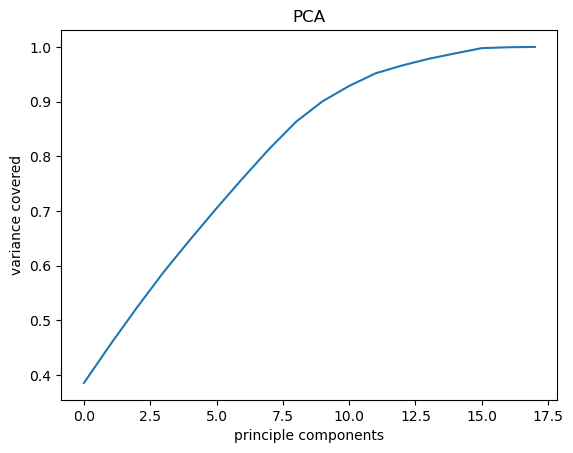

In [548]:
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))  #cumulative sum  #this explained ratio will tell the correlation bw feature 
plt.xlabel('principle components') #and label for every component of feature i.e igon values or the distance.
plt.ylabel('variance covered')   
plt.title('PCA')
plt.show()

From this figure we can say that 14 Components will be enough which will cover maximum variance so lets build 14 component from the existing features.

In [549]:
pca=PCA(n_components=14)
new_components=pca.fit_transform(x)

In [550]:
princi_comp=pd.DataFrame(new_components,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14'])
princi_comp

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14
0,-0.830007,-1.433839,-1.730680,0.762881,1.404643,0.283977,1.343542,-0.246210,-0.306165,1.294025,-1.117931,0.512424,-0.406762,0.058565
1,-0.876245,-1.411450,-1.718427,0.757713,1.399045,0.290784,0.557470,-0.318760,-0.408793,1.331173,-1.085657,0.490957,-0.484841,0.021623
2,-0.587054,-1.478732,-1.754252,0.752215,1.414065,0.270659,-0.245417,-0.378889,-0.415211,1.327394,-1.155234,0.538035,-0.596554,-0.154585
3,-0.811375,-1.472597,-1.722784,0.761740,1.410803,0.272812,-1.029363,-0.483770,-0.512888,1.331359,-1.123584,0.377088,-0.528782,0.060888
4,-0.924554,-1.353343,-1.602170,0.699085,1.431177,0.268473,1.549046,-0.231093,-0.055825,1.281566,-1.152060,0.268493,-0.539791,0.126274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17898,-1.764991,1.828082,2.382536,0.839238,-1.379625,-0.058098,-1.329346,0.561441,-0.306718,-0.590618,0.955415,0.426253,-0.011385,0.247623
17899,-1.902974,1.864552,2.444717,0.745213,-1.324522,-0.102910,1.351117,0.825695,0.242346,-0.588179,0.934565,0.385354,-0.147114,0.067164
17900,-1.509598,1.589813,2.265801,0.696826,-1.223639,-0.110109,0.539167,0.848506,0.414496,-0.309016,1.323799,0.713327,-1.063952,-0.151496
17901,-1.376210,1.596387,2.280230,0.708860,-1.227119,-0.109197,-0.252988,0.787857,0.327850,-0.324784,1.295901,0.742355,-1.012132,-0.162294


Here we have made 14 components from the existing features.

# Model building-III

In [551]:
#Importing libraries-

In [552]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge

In [553]:
maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(princi_comp,y,test_size=0.30,random_state=i) 
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)   
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print('Best accuracy is', maxacc,'at random state',maxrs) 

Best accuracy is 0.5073998745715412 at random state 109


Best accuracy we got is 50% for linear regression for random state=90.

In [554]:
x_train,x_test,y_train,y_test=train_test_split(princi_comp,y,test_size=0.30,random_state=maxrs)

Splitted the data on the same random state.

In [555]:
#Linear regression-

In [556]:
lr=LinearRegression()
lr.fit(x_train,y_train)
predlr=lr.predict(x_test)
pred_train=lr.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predlr))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predlr))
print('mean squared error- ',mean_squared_error(y_test,predlr))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predlr)))

r2_score on test data - 0.5073998745715412
r2_score on train data - 0.475600739096089
mean absolute error-  0.21690255516773
mean squared error-  0.08144836845010918
root mean squared error-  0.28539160543034403


for linear regression we got train accuracy-48% and test accuracy-51% which looks like underfitted model.

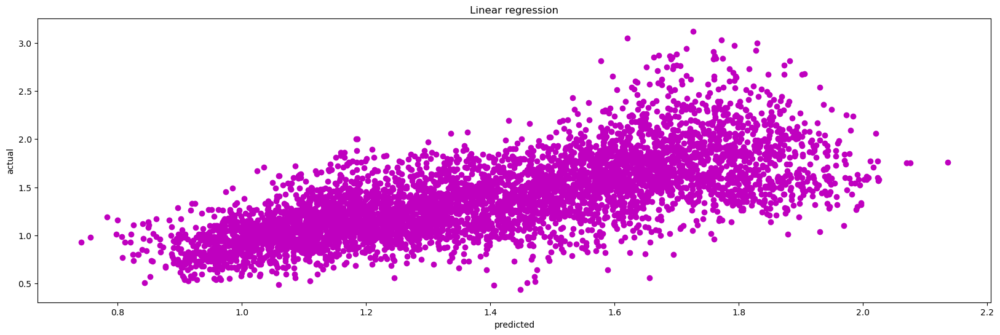

In [557]:
plt.figure(figsize=(20,6))
plt.scatter(x=predlr,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

Here we can clearly see that actual & predicted values are far away from each other.

In [558]:
#Cross validation score-

In [559]:
score=cross_val_score(lr,princi_comp,y)
print(score)
print(score.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predlr)-score.mean())*100)

[-0.46613314  0.17174101  0.44739667  0.06079759  0.10167113]
0.06309465249133432
difference bw r2_score and cross validation score is - 44.43052220802069


The cross validation score for linear regression is 6%.

In [560]:
rf=RandomForestRegressor()
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
pred_train=rf.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predrf))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predrf))
print('mean squared error- ',mean_squared_error(y_test,predrf))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predrf)))

r2_score on test data - 0.8698650607419254
r2_score on train data - 0.9804403681972228
mean absolute error-  0.10429534537330105
mean squared error-  0.021517003211692424
root mean squared error-  0.1466867519978966


for linear regression we got train accuracy-98% and test accuracy-87%.

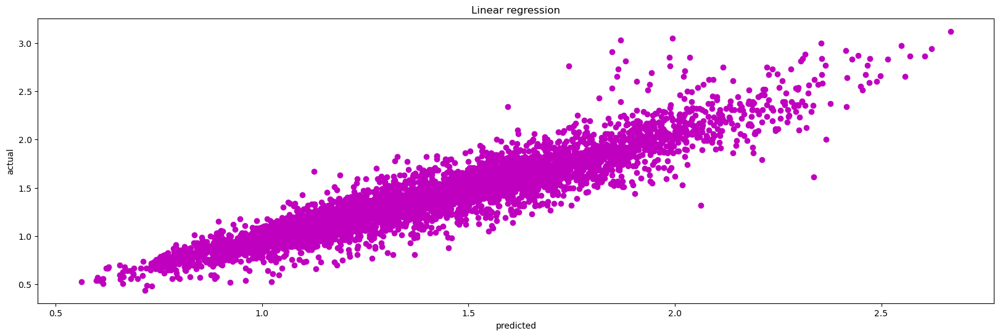

In [561]:
plt.figure(figsize=(20,6))
plt.scatter(x=predrf,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

Here in this plot actual & predicted values are not that far.

In [562]:
#Cross validation score-

In [563]:
score1=cross_val_score(rf,princi_comp,y)
print(score1)
print(score1.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predrf)-score1.mean())*100)

[-0.30189692  0.32622654  0.59394614  0.19036646  0.04521998]
0.17077244248075446
difference bw r2_score and cross validation score is - 69.9092618261171


the cross validation score for random forest is 17%.

In [564]:
kn=KNN()
kn.fit(x_train,y_train)
predkn=kn.predict(x_test)
pred_train=kn.predict(x_train)  
print('r2_score on test data -',r2_score(y_test,predkn))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predkn))
print('mean squared error- ',mean_squared_error(y_test,predkn))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predkn)))

r2_score on test data - 0.7982802813534723
r2_score on train data - 0.8680083321756036
mean absolute error-  0.12976019363247068
mean squared error-  0.03335310147086204
root mean squared error-  0.18262831508520808


for KNN model we got train accuracy-87% and test accuracy-80%.

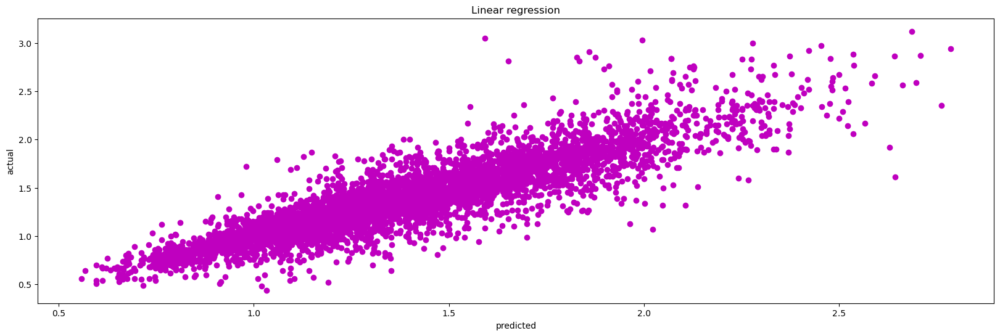

In [565]:
plt.figure(figsize=(20,6))
plt.scatter(x=predkn,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

Here in this plot actual & predicted values are little far.

In [566]:
#Cross validation score-

In [567]:
score2=cross_val_score(kn,princi_comp,y)
print(score2)
print(score2.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predkn)-score2.mean())*100)

[-0.76072794  0.22273435  0.44524457 -0.28381034 -0.03871446]
-0.0830547649082997
difference bw r2_score and cross validation score is - 88.1335046261772


the cross validation score for KNN is 8%.

In [568]:
#GradientBoostingRegressor

In [569]:
gb=GradientBoostingRegressor()
gb.fit(x_train,y_train)
predgb=gb.predict(x_test)
pred_train=gb.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predgb))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predgb))
print('mean squared error- ',mean_squared_error(y_test,predgb))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predgb)))

r2_score on test data - 0.6477976372327738
r2_score on train data - 0.664684663828425
mean absolute error-  0.18198868995011863
mean squared error-  0.05823447118839644
root mean squared error-  0.24131819489710352


for Gradient boosting regressor model we got train accuracy-66% and test accuracy-65% which looks like underfitted model.

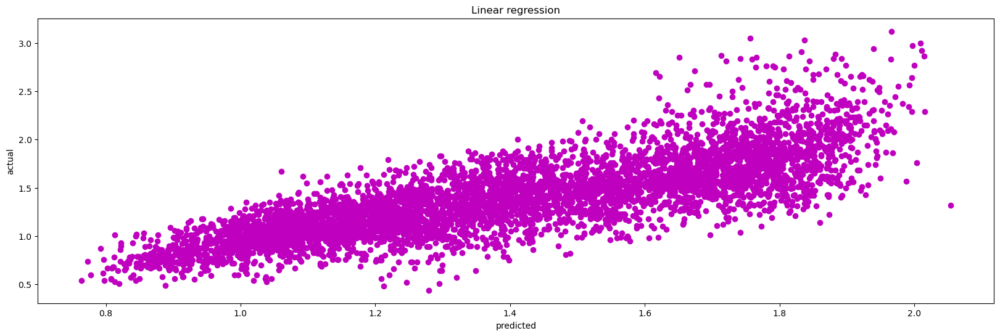

In [570]:
plt.figure(figsize=(20,6))
plt.scatter(x=predgb,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

Here in this plot actual & predicted values are far.

In [571]:
#Cross validation score-

In [572]:
score3=cross_val_score(gb,princi_comp,y)
print(score3)
print(score3.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predgb)-score3.mean())*100)

[-0.46457942  0.3452506   0.56856785  0.15967656  0.1442142 ]
0.15062595809734086
difference bw r2_score and cross validation score is - 49.7171679135433


The cross validation score for gradient boosting regressor is 15%.

In [573]:
#Lasso-

In [574]:
lasso=Lasso()
lasso.fit(x_train,y_train)
predla=lasso.predict(x_test)
pred_train=lasso.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predla))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predla))
print('mean squared error- ',mean_squared_error(y_test,predla))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predla)))

r2_score on test data - -0.0007032544478324798
r2_score on train data - 0.0
mean absolute error-  0.32704097566086343
mean squared error-  0.16546006216827008
root mean squared error-  0.40676782341806494


for Gradient boosting regressor model we got train accuracy-0% and test accuracy-0% which looks like this model is not performing well.

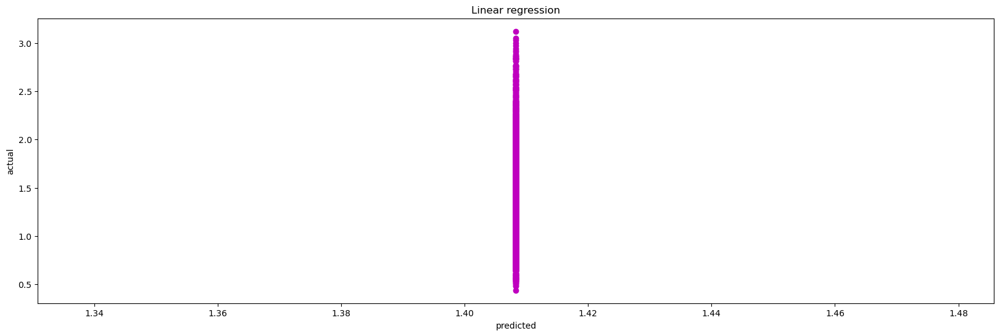

In [575]:
plt.figure(figsize=(20,6))
plt.scatter(x=predla,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

In [576]:
#Cross validation score-

In [577]:
score4=cross_val_score(lasso,princi_comp,y)
print(score4)
print(score4.mean())
print('difference bw r2_score and cross validation score is- ',(r2_score(y_test,predla)-score4.mean())*100)

[-3.92565437 -0.74976822 -0.01992998 -0.44689421 -0.82060643]
-1.192570642323561
difference bw r2_score and cross validation score is-  119.18673878757285


The cross validation score for lasso is -119%

In [578]:
#Ridge-

In [579]:
rd=Ridge()
rd.fit(x_train,y_train)
predri=rd.predict(x_test)
pred_train=rd.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predri))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predri))
print('mean squared error- ',mean_squared_error(y_test,predri))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predri)))

r2_score on test data - 0.5073957636895203
r2_score on train data - 0.4756007300060817
mean absolute error-  0.21690458535058377
mean squared error-  0.0814490481588957
root mean squared error-  0.28539279626314273


for Gradient boosting regressor model we got train accuracy-48% and test accuracy-51% which looks like an overfitted model.

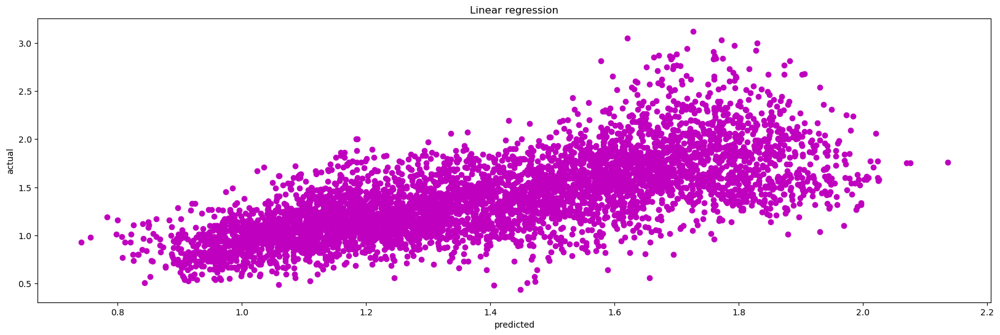

In [580]:
plt.figure(figsize=(20,6))
plt.scatter(x=predri,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

Here in this plot actual & predicted values are far.

In [581]:
#Cross validation score-

In [582]:
score5=cross_val_score(rd,princi_comp,y)
print(score5)
print(score5.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predri)-score5.mean())*100)

[-0.4661622   0.17177833  0.44740637  0.06080272  0.10166976]
0.06309899525276144
difference bw r2_score and cross validation score is - 44.42967684367589


The cross validation score for ridge 6%.

In [583]:
#DecisionTreeRegressor-

In [584]:
dt=DecisionTreeRegressor()
dt.fit(x_train,y_train)
preddt=dt.predict(x_test)
pred_train=dt.predict(x_train)  
print('r2_score on test data -',r2_score(y_test,preddt))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,preddt))
print('mean squared error- ',mean_squared_error(y_test,preddt))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,preddt)))

r2_score on test data - 0.7128716746818722
r2_score on train data - 1.0
mean absolute error-  0.14265127536771552
mean squared error-  0.047474883634332526
root mean squared error-  0.21788731866341493


for Decision tree regressor model we got train accuracy-100% and test accuracy-71% which looks like an overfitted model.

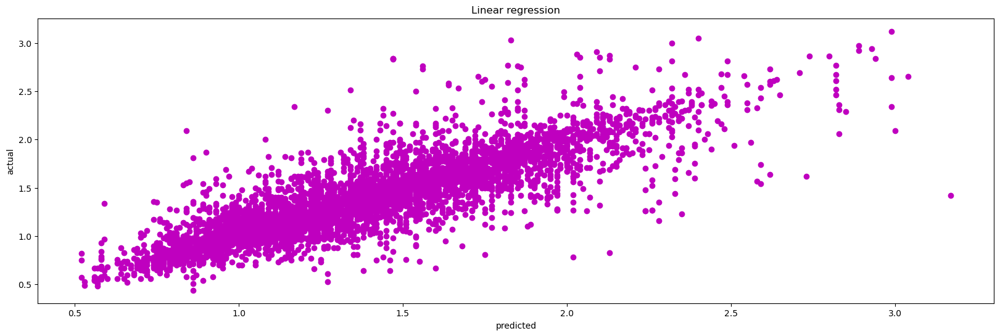

In [585]:
plt.figure(figsize=(20,6))
plt.scatter(x=preddt,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

Here in this plot actual & predicted values are far.

In [586]:
#Cross validation score-

In [587]:
score6=cross_val_score(dt,princi_comp,y)
print(score6)
print(score6.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,preddt)-score6.mean())*100)

[-1.38462665 -0.01427838  0.20768288 -0.6412188  -0.41032402]
-0.44855299651493735
difference bw r2_score and cross validation score is - 116.14246711968094


The cross validation score for decision tree is 44%.

In [588]:
#SVR

In [589]:
from sklearn.svm import SVR

In [590]:
svr=SVR()
svr.fit(x_train,y_train)
predsv=svr.predict(x_test)
pred_train=svr.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predsv))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predsv))
print('mean squared error- ',mean_squared_error(y_test,predsv))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predsv)))

r2_score on test data - 0.8346768158874617
r2_score on train data - 0.8517235318365073
mean absolute error-  0.11869344089990168
mean squared error-  0.02733516074773889
root mean squared error-  0.16533348344403467


for support vector regressor model we got train accuracy-85% and test accuracy-83% which looks like an normal generalsied model among other models.

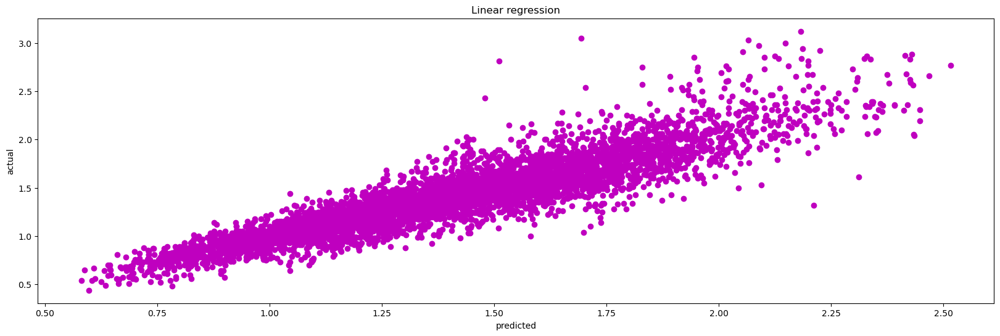

In [591]:
plt.figure(figsize=(20,6))
plt.scatter(x=predsv,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

Here in this plot actual & predicted values are not very far.

In [592]:
#Cross validation score-

In [593]:
score7=cross_val_score(svr,princi_comp,y)
print(score7)
print(score7.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predsv)-score7.mean())*100)

[-0.40229727  0.61177208  0.51217249  0.24277176 -0.24524117]
0.14383557679789397
difference bw r2_score and cross validation score is - 69.08412390895677


The cross validation score for SVR is 14%.

In [594]:
et=ExtraTreesRegressor()
et.fit(x_train,y_train)
predet=et.predict(x_test)
pred_train=et.predict(x_train)   
print('r2_score on test data -',r2_score(y_test,predet))
print('r2_score on train data -', r2_score(y_train,pred_train))  
print('mean absolute error- ',mean_absolute_error(y_test,predet))
print('mean squared error- ',mean_squared_error(y_test,predet))
print('root mean squared error- ',np.sqrt(mean_squared_error(y_test,predet)))

r2_score on test data - 0.8976921685522192
r2_score on train data - 1.0
mean absolute error-  0.09201612362688513
mean squared error-  0.01691596392478123
root mean squared error-  0.13006138521783178


for Extra tree regressor model we got train accuracy-100% and test accuracy-90% which looks like an normal generalsied model among other models.

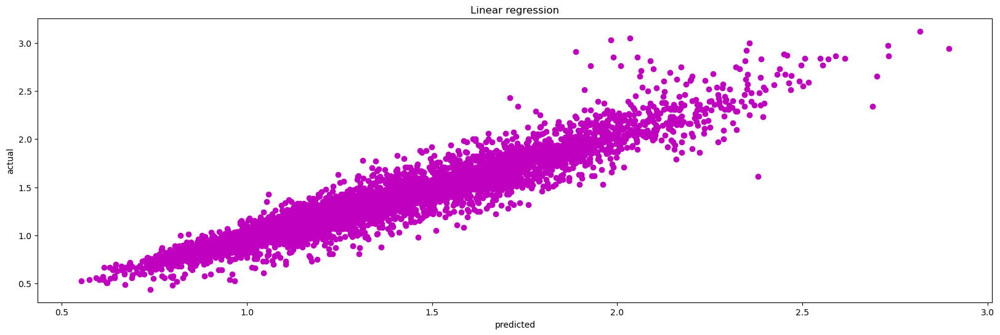

In [595]:
plt.figure(figsize=(20,6))
plt.scatter(x=predet,y=y_test,color='m')
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('Linear regression')
plt.show()

Here in this plot actual & predicted values are not very far.

In [596]:
#Cross validation score-

In [597]:
score8=cross_val_score(et,princi_comp,y)
print(score8)
print(score8.mean())
print('difference bw r2_score and cross validation score is -',(r2_score(y_test,predet)-score8.mean())*100)

[0.06866216 0.38573622 0.63961449 0.27668908 0.12100643]
0.29834167707169174
difference bw r2_score and cross validation score is - 59.93504914805274


The cross validation score for extra tree regressor is 30%

Here we can see that support vector regressor is working best on this data set as it is giving 85% train accuracy & test accuracy-83% with 14% cross val score.

# Hyperparameter Tunning-

In [598]:
from sklearn.model_selection import RandomizedSearchCV

In [599]:
param_grid={'C' : [1,2,3,4],'degree':[3,4,5,6],'gamma':['scale', 'auto'],
            'kernel':['linear', 'poly', 'rbf']}

In [600]:
SVR().get_params().keys() 

dict_keys(['C', 'cache_size', 'coef0', 'degree', 'epsilon', 'gamma', 'kernel', 'max_iter', 'shrinking', 'tol', 'verbose'])

In [602]:
rs=RandomizedSearchCV(SVR(),param_grid,cv=5)

In [603]:
rs.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=SVR(),
                   param_distributions={'C': [1, 2, 3, 4],
                                        'degree': [3, 4, 5, 6],
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'poly', 'rbf']})

In [604]:
rs.best_params_

{'kernel': 'rbf', 'gamma': 'auto', 'degree': 4, 'C': 4}

In [611]:
final_model=SVR(kernel= 'rbf', gamma= 'auto', degree= 4, C= 4)
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)

In [612]:
r2_score(y_test,pred)

0.8800351105819546

Here we can see that accuracy has been increased to 88% for support vector regressor model with the help of randomised seacrh cv.

# Saving model-

In [613]:
import joblib
joblib.dump(final_model,'Average Price-3')

['Average Price-3']

In [614]:
model=joblib.load('Average Price-3')

# Prediction with our finalsied model-

In [615]:
prediction=model.predict(x_test)
prediction

array([1.89288803, 0.94590214, 1.43068606, ..., 1.66373973, 2.52201115,
       1.43264563])

In [616]:
a=np.array(y_test)
df=pd.DataFrame()
df['predicted']=prediction
df['original']=a
df

,predicted,original
0,1.892888,2.06
1,0.945902,0.94
2,1.430686,1.28
3,0.654927,0.56
4,1.005496,0.97
...,...,...
5366,1.438583,1.43
5367,1.634746,1.67
5368,1.663740,1.53
5369,2.522011,2.66


Here we have made 3 models & save them for regression problem.

# Classification Problem(Predicting Region-)

In [730]:
#Importing libraries-

In [109]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [110]:
df

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,conventional,2015,Albany,12,27
1,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,conventional,2015,Albany,12,20
2,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,conventional,2015,Albany,12,13
3,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,conventional,2015,Albany,12,6
4,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,conventional,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,organic,2018,WestTexNewMexico,2,4
18245,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,organic,2018,WestTexNewMexico,1,28
18246,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,organic,2018,WestTexNewMexico,1,21
18247,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,organic,2018,WestTexNewMexico,1,14


In [111]:
#Checking no of unique values in each column-

In [112]:
df.nunique().to_frame('No of unique values')

,No of unique values
AveragePrice,259
Total Volume,17891
4046,17364
4225,17759
4770,11876
Total Bags,17767
Small Bags,17136
Large Bags,14783
XLarge Bags,5428
type,2


So here we can see that region column has 54 classes so this is multiclass classification problem with 54 classes.

# Encoding of the object data-

In [139]:
#Applying label encoder on type & region column-

In [140]:
from sklearn.preprocessing import LabelEncoder

In [141]:
le= LabelEncoder()

In [142]:
df1=le.fit_transform(df['type'])
pd.Series(df1)

0        0
1        0
2        0
3        0
4        0
        ..
17898    1
17899    1
17900    1
17901    1
17902    1
Length: 17903, dtype: int32

In [143]:
df['type']=df1

In [144]:
df

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,0,2015,Albany,12,27
1,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,0,2015,Albany,12,20
2,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,0,2015,Albany,12,13
3,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,0,2015,Albany,12,6
4,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,0,2015,Albany,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,1,2018,WestTexNewMexico,2,4
18245,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,1,2018,WestTexNewMexico,1,28
18246,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,1,2018,WestTexNewMexico,1,21
18247,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,1,2018,WestTexNewMexico,1,14


In [145]:
df2=le.fit_transform(df['region'])
pd.Series(df2)

0         0
1         0
2         0
3         0
4         0
         ..
17898    53
17899    53
17900    53
17901    53
17902    53
Length: 17903, dtype: int32

In [146]:
df['region']=df2

In [147]:
df

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,1.33,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,-0.699849,0,2015,0,12,27
1,1.35,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,-0.699849,0,2015,0,12,20
2,0.93,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,-0.699849,0,2015,0,12,13
3,1.08,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,-0.699849,0,2015,0,12,6
4,1.28,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,-0.699849,0,2015,0,11,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,-0.699849,1,2018,53,2,4
18245,1.71,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,-0.699849,1,2018,53,1,28
18246,1.87,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,-0.699849,1,2018,53,1,21
18247,1.93,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,-0.699849,1,2018,53,1,14


Here we can see that our type & region column both has been encoded by label encoder. here we can see that we have to predict the region so we have to encode it with label encoder as to convert it as multiclass classification problem.

In [148]:
#Checking data type again-

In [749]:
df.dtypes

AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type              int32
year              int64
region            int64
Month             int64
Day               int64
dtype: object

# Correlation bw features & label-

In [750]:
df.corr()['region'].sort_values(ascending=False).to_frame()

,region
region,1.000000
4046,0.173942
Large Bags,0.108954
Total Bags,0.094371
Total Volume,0.084571
Small Bags,0.084065
4770,0.053784
4225,0.047400
type,0.007487
year,0.005916


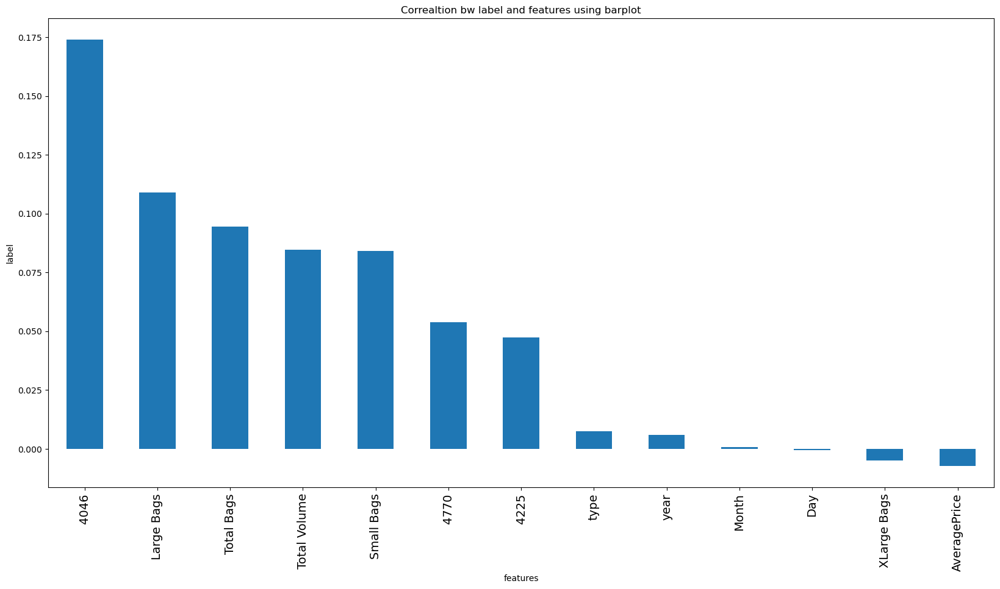

In [751]:
plt.figure(figsize=(20,10))
df.corr()['region'].sort_values(ascending=False).drop(['region']).plot(kind='bar')
plt.xlabel('features')
plt.ylabel('label')
plt.xticks(fontsize=14)
plt.title('Correaltion bw label and features using barplot')
plt.show()

# Observations-

1. 4046 has the highest correlationship with target variable.
2. Large bags,Total Bags,Total Volume,Small Bags also has good relationship with the target variable.
3. Day & month XLarge bags has the least relationship with target variable.

In [752]:
#Dropping least correlated features-

In [753]:
df=df.drop(columns=['type','year','Month','Day','XLarge Bags','AveragePrice'],axis=1)
df

,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,region
0,-0.086605,-0.658619,0.307313,-0.247250,-0.524004,-0.340627,-0.773351,0
1,-0.155746,-0.776870,0.231647,-0.201041,-0.485890,-0.306425,-0.763435,0
2,0.179327,-0.731947,0.579503,-0.007072,-0.552018,-0.366303,-0.750820,0
3,0.003876,-0.634200,0.415100,-0.148322,-0.695449,-0.496853,-0.691865,0
4,-0.187640,-0.685293,0.224806,-0.137918,-0.669157,-0.477201,-0.600975,0
...,...,...,...,...,...,...,...,...
18244,-0.674587,-0.467366,-0.919470,-1.238310,-0.334466,-0.178839,-0.410859,53
18245,-0.767550,-0.619883,-0.665372,-1.238310,-0.496897,-0.325977,-0.481465,53
18246,-0.771505,-0.619831,-0.772496,0.401546,-0.490952,-0.308728,-0.943486,53
18247,-0.698077,-0.550282,-0.710543,0.401246,-0.424252,-0.248932,-0.908510,53


# Separating features and label-

In [754]:
x=df.drop('region',axis=1)  
y=df['region']

# Feature Scaling-

In [755]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags
0,-0.076530,-0.656903,0.335221,-0.243408,-0.547244,-0.370542,-0.774585
1,-0.147484,-0.777783,0.257481,-0.196561,-0.507065,-0.333666,-0.764440
2,0.196376,-0.731861,0.614876,0.000080,-0.576775,-0.398225,-0.751534
3,0.016324,-0.631941,0.445964,-0.143116,-0.727977,-0.538979,-0.691219
4,-0.180215,-0.684170,0.250452,-0.132569,-0.700261,-0.517791,-0.598231
...,...,...,...,...,...,...,...
17898,-0.679933,-0.461397,-0.925202,-1.248125,-0.347438,-0.196107,-0.403726
17899,-0.775334,-0.617305,-0.664137,-1.248125,-0.518668,-0.354746,-0.475961
17900,-0.779393,-0.617252,-0.774198,0.414330,-0.512401,-0.336149,-0.948648
17901,-0.704039,-0.546157,-0.710546,0.414026,-0.442088,-0.271679,-0.912865


In [756]:
y

0         0
1         0
2         0
3         0
4         0
         ..
18244    53
18245    53
18246    53
18247    53
18248    53
Name: region, Length: 17903, dtype: int64

Here we can see that our features has been scaled.

# Checking Multicollinearity among features-

In [757]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features']=x.columns
vif

,VIF Values,Features
0,49.364481,Total Volume
1,6.660707,4046
2,10.791462,4225
3,3.372340,4770
4,35.832332,Total Bags
5,17.681524,Small Bags
6,3.478436,Large Bags


Here we can see that vif is higher than the acceptable range in total volume,total bags & small bags columns so we have to drop columns to reduce the multicollinearity among features.

In [758]:
x=x.drop(columns=['Total Volume','Total Bags',],axis=1)
x

,4046,4225,4770,Small Bags,Large Bags
0,-0.656903,0.335221,-0.243408,-0.370542,-0.774585
1,-0.777783,0.257481,-0.196561,-0.333666,-0.764440
2,-0.731861,0.614876,0.000080,-0.398225,-0.751534
3,-0.631941,0.445964,-0.143116,-0.538979,-0.691219
4,-0.684170,0.250452,-0.132569,-0.517791,-0.598231
...,...,...,...,...,...
17898,-0.461397,-0.925202,-1.248125,-0.196107,-0.403726
17899,-0.617305,-0.664137,-1.248125,-0.354746,-0.475961
17900,-0.617252,-0.774198,0.414330,-0.336149,-0.948648
17901,-0.546157,-0.710546,0.414026,-0.271679,-0.912865


In [759]:
#Checking multicollinearity again-

In [760]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features']=x.columns
vif

,VIF Values,Features
0,3.456797,4046
1,4.075010,4225
2,3.366553,4770
3,3.805453,Small Bags
4,1.782037,Large Bags


Here we can see that the muticollinearity has been removed among features so now we can move further for model building-

# Treating imbalance data with Oversampling method-

In [761]:
y.value_counts()

0     338
37    338
26    338
28    338
29    338
30    338
31    338
32    338
33    338
34    338
35    338
38    338
24    338
39    338
40    338
41    338
44    338
45    338
46    338
49    338
50    338
52    338
25    338
27    338
6     338
22    338
5     338
2     338
8     338
19    338
18    338
17    338
16    338
15    338
7     338
13    338
4     338
9     338
11    338
10    337
20    337
14    337
12    336
21    336
53    335
48    334
3     333
23    329
1     320
43    312
42    310
36    308
47    279
51    178
Name: region, dtype: int64

# Here we can say that data is not balanced so we will balance the data by oversampling method-

In [762]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x,y=sm.fit_resample(x,y)

In [763]:
y.value_counts()

0     338
40    338
29    338
30    338
31    338
32    338
33    338
34    338
35    338
36    338
37    338
38    338
39    338
41    338
1     338
42    338
43    338
44    338
45    338
46    338
47    338
48    338
49    338
50    338
51    338
52    338
28    338
27    338
26    338
25    338
2     338
3     338
4     338
5     338
6     338
7     338
8     338
9     338
10    338
11    338
12    338
13    338
14    338
15    338
16    338
17    338
18    338
19    338
20    338
21    338
22    338
23    338
24    338
53    338
Name: region, dtype: int64

Here we can see that data has been balanced now.

# Model-I 

In [767]:
#Importing library-

In [765]:
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier

In [766]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i) 
    sv=SVC()
    sv.fit(x_train,y_train)
    pred=sv.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print('Best accuracy is', maxacc,'at random state',maxrs)               

Best accuracy is 0.7505478451424398 at random state 101


In [769]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=maxrs)

In [770]:
def metric_score(clf,x_train,x_test,y_train,y_test, train=True):
    if train:
        y_pred=clf.predict(x_train)
        
        print('=====================Train Result=====================')
        print(f'accuracy score: {accuracy_score(y_train,y_pred)*100:.2f}%')
        
        
        
    elif train==False:
        pred=clf.predict(x_test)
        
        print('=====================Test Result=====================') 
        print(f'accuracy_score:{accuracy_score(y_test,pred)*100:.2f}%')
        print('\n\n Test classification report\n', classification_report(y_test,pred,digits=2))

In [771]:
#Random forest-

In [772]:
rf=RandomForestClassifier() 

rf.fit(x_train,y_train)

RandomForestClassifier()

In [773]:
metric_score(rf,x_train,x_test,y_train,y_test,train=True) 
metric_score(rf,x_train,x_test,y_train,y_test, train=False)

=====================Train Result=====================
accuracy score: 100.00%
=====================Test Result=====================
accuracy_score:85.59%


 Test classification report
               precision    recall  f1-score   support

           0       0.80      0.88      0.84       106
           1       0.79      0.79      0.79        98
           2       0.94      0.98      0.96        92
           3       0.87      0.79      0.83       109
           4       0.91      0.89      0.90       108
           5       0.81      0.75      0.78       106
           6       0.97      1.00      0.98        95
           7       0.91      0.93      0.92       114
           8       0.94      0.88      0.91       105
           9       0.87      0.84      0.86       109
          10       0.83      0.85      0.84       101
          11       0.87      0.91      0.89        98
          12       0.91      0.82      0.87       102
          13       0.86      0.83      0.84       110
   

For randm forest model i got train accuracy-100% & test accuracy-86%.

In [774]:
#Cross validation score-

In [775]:
score=cross_val_score(rf,x,y)
print(score)
print(score.mean())

[0.63462065 0.78855108 0.7339726  0.63287671 0.50986301]
0.6599768125077385


The cross validation score is 66%.

In [776]:
#Support vector classifier-

In [777]:
sv=SVC()
sv.fit(x_train,y_train)

SVC()

In [778]:
metric_score(sv,x_train,x_test,y_train,y_test,train=True) 
metric_score(sv,x_train,x_test,y_train,y_test, train=False)

=====================Train Result=====================
accuracy score: 74.46%
=====================Test Result=====================
accuracy_score:75.05%


 Test classification report
               precision    recall  f1-score   support

           0       0.66      0.90      0.76       106
           1       0.59      0.59      0.59        98
           2       0.90      0.92      0.91        92
           3       0.78      0.69      0.73       109
           4       0.81      0.73      0.77       108
           5       0.84      0.55      0.66       106
           6       0.97      0.97      0.97        95
           7       0.84      0.76      0.80       114
           8       0.89      0.85      0.87       105
           9       0.74      0.79      0.76       109
          10       0.65      0.72      0.68       101
          11       0.83      0.84      0.83        98
          12       0.85      0.82      0.84       102
          13       0.62      0.59      0.61       110
    

For support vector classifier i got train accuracy-74% & test accuracy-75%.

In [779]:
#Cross validation score-

In [780]:
score=cross_val_score(sv,x,y)
print(score)
print(score.mean())

[0.59463161 0.74527527 0.63945205 0.57150685 0.45726027]
0.6016252105822011


The cross validation score is 60%.

In [781]:
#GradientBoostingClassifier-

In [782]:
gb=GradientBoostingClassifier()
gb.fit(x_train,y_train)

GradientBoostingClassifier()

In [783]:
metric_score(gb,x_train,x_test,y_train,y_test,train=True) 
metric_score(gb,x_train,x_test,y_train,y_test, train=False)

=====================Train Result=====================
accuracy score: 96.45%
=====================Test Result=====================
accuracy_score:79.78%


 Test classification report
               precision    recall  f1-score   support

           0       0.74      0.81      0.77       106
           1       0.72      0.71      0.72        98
           2       0.88      0.96      0.92        92
           3       0.82      0.76      0.79       109
           4       0.82      0.82      0.82       108
           5       0.72      0.62      0.67       106
           6       0.96      0.94      0.95        95
           7       0.87      0.85      0.86       114
           8       0.94      0.84      0.88       105
           9       0.81      0.72      0.76       109
          10       0.69      0.74      0.71       101
          11       0.86      0.85      0.86        98
          12       0.87      0.80      0.84       102
          13       0.81      0.76      0.79       110
    

For Gradient boosting classifier i got train accuracy-96% & test accuracy-80%

In [784]:
#Cross validation score-

In [785]:
score=cross_val_score(gb,x,y)
print(score)
print(score.mean())

[0.51355793 0.74719255 0.68136986 0.58191781 0.42986301]
0.5907802328504481


The cross validation score is 59%.

In [786]:
#BaggingClassifier-

In [787]:
bc=BaggingClassifier()
bc.fit(x_train,y_train)

BaggingClassifier()

In [788]:
metric_score(bc,x_train,x_test,y_train,y_test,train=True) 
metric_score(bc,x_train,x_test,y_train,y_test, train=False)

=====================Train Result=====================
accuracy score: 99.17%
=====================Test Result=====================
accuracy_score:82.09%


 Test classification report
               precision    recall  f1-score   support

           0       0.74      0.81      0.77       106
           1       0.74      0.80      0.77        98
           2       0.89      0.93      0.91        92
           3       0.82      0.80      0.81       109
           4       0.84      0.86      0.85       108
           5       0.73      0.69      0.71       106
           6       0.95      0.99      0.97        95
           7       0.87      0.89      0.88       114
           8       0.93      0.88      0.90       105
           9       0.83      0.85      0.84       109
          10       0.78      0.80      0.79       101
          11       0.82      0.91      0.86        98
          12       0.85      0.78      0.82       102
          13       0.85      0.84      0.84       110
    

for bagging classifier train accuracy-99% & test accuracy-82%.

In [789]:
#Cross validation score-

In [790]:
score=cross_val_score(bc,x,y)
print(score)
print(score.mean())

[0.56751575 0.74554916 0.68246575 0.60438356 0.4660274 ]
0.613188325210207


the cross validation score is 61%.

In [791]:
#ExtraTreeClassifier-

In [792]:
et=ExtraTreesClassifier()
et.fit(x_train,y_train)

ExtraTreesClassifier()

In [793]:
metric_score(et,x_train,x_test,y_train,y_test,train=True) 
metric_score(et,x_train,x_test,y_train,y_test, train=False)

=====================Train Result=====================
accuracy score: 100.00%
=====================Test Result=====================
accuracy_score:86.98%


 Test classification report
               precision    recall  f1-score   support

           0       0.81      0.90      0.85       106
           1       0.87      0.84      0.85        98
           2       0.93      0.99      0.96        92
           3       0.83      0.79      0.81       109
           4       0.95      0.91      0.93       108
           5       0.82      0.71      0.76       106
           6       0.98      0.99      0.98        95
           7       0.92      0.94      0.93       114
           8       0.93      0.90      0.92       105
           9       0.89      0.87      0.88       109
          10       0.86      0.89      0.87       101
          11       0.90      0.95      0.93        98
          12       0.93      0.85      0.89       102
          13       0.84      0.86      0.85       110
   

for extra tree classifier train accuracy-100% & test accuracy-87%.

In [794]:
#Cross validation score-

In [795]:
score=cross_val_score(et,x,y)
print(score)
print(score.mean())

[0.673788   0.80279376 0.74328767 0.6369863  0.53260274]
0.6778916941502235


the cross validation score is 68%.

In [796]:
#DecisionTreeClassifier-

In [797]:
from sklearn.tree import DecisionTreeClassifier

In [798]:
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)

DecisionTreeClassifier()

In [799]:
metric_score(dt,x_train,x_test,y_train,y_test,train=True) 
metric_score(dt,x_train,x_test,y_train,y_test, train=False)

=====================Train Result=====================
accuracy score: 100.00%
=====================Test Result=====================
accuracy_score:75.75%


 Test classification report
               precision    recall  f1-score   support

           0       0.72      0.75      0.73       106
           1       0.70      0.70      0.70        98
           2       0.86      0.85      0.85        92
           3       0.73      0.78      0.75       109
           4       0.86      0.79      0.82       108
           5       0.61      0.63      0.62       106
           6       0.95      0.96      0.95        95
           7       0.82      0.85      0.84       114
           8       0.90      0.81      0.85       105
           9       0.76      0.77      0.77       109
          10       0.73      0.67      0.70       101
          11       0.80      0.83      0.81        98
          12       0.77      0.77      0.77       102
          13       0.68      0.71      0.70       110
   

for decision tree classifier train accuracy-100% & test accuracy-76%.

In [800]:
#Cross validation score-

In [801]:
score=cross_val_score(dt,x,y)
print(score)
print(score.mean())

[0.49602849 0.66228431 0.62767123 0.53178082 0.42958904]
0.5494707773813141


the cross validation score is 55%.

here we can see that from the above performance of the model the best performing model is support vector classifier which is giving train accuracy-74% & test accuracy-75% with cross validation score of 60%.

# Hyperparameter tunning-

In [802]:
from sklearn.model_selection import RandomizedSearchCV

In [840]:
param_grid={'C':[100,150,200],'random_state': [10,20,200,300,400],'degree':[1,2,3,4,5],'kernel' : ['linear', 'poly'],'gamma' : ['scale', 'auto'],'max_iter':[-1,1]}

In [841]:
rs=RandomizedSearchCV(SVC(),param_grid,cv=5)

In [842]:
rs.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=SVC(),
                   param_distributions={'C': [100, 150, 200],
                                        'degree': [1, 2, 3, 4, 5],
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'poly'],
                                        'max_iter': [-1, 1],
                                        'random_state': [10, 20, 200, 300,
                                                         400]})

In [843]:
rs.best_estimator_

SVC(C=100, gamma='auto', kernel='poly', random_state=10)

In [844]:
final_model=SVC(C=100,
                gamma='auto',
 kernel= 'poly',
 random_state= 20)
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)

In [845]:
accuracy_score(y_test,pred)

0.7618699780861943

The accuracy of model is increased to 76% with the help of randomized search CV.

# Saving model-

In [846]:
import joblib
joblib.dump(final_model,'Region classification-I')

['Region classification-I']

In [847]:
model=joblib.load('Region classification-I')

In [848]:
#Lets make the prediction with our final model-

In [849]:
prediction=model.predict(x_test)
prediction

array([ 8, 12, 41, ..., 13, 48, 20], dtype=int64)

In [850]:
a=np.array(y_test)
df=pd.DataFrame()
df['predicted']=prediction
df['original']=a
df

,predicted,original
0,8,8
1,12,12
2,41,41
3,28,28
4,42,42
...,...,...
5471,19,21
5472,47,47
5473,13,13
5474,48,48
